## 1. Purpose

Compares every model built so far — Chapman-Richards, average-by-age, linear regression, random
forest, DNN, and PINN — for both the 4survey and 6survey cohorts, organized by **which split each
model was tested under**, not by model type. That's the structural choice this notebook makes:
`plot_level_split` only ever had 4 models (DNN/PINN never run it, by design — see section 3), so a
model-type-first structure meant DNN/PINN got bolted on as an afterthought at the end. Organizing
by split instead means each section shows the full comparison for whichever models actually ran
under that split, once.

This notebook only reads already-saved results from `outputs/` (`metrics.json`,
`predictions.csv`) — it does not refit or re-evaluate anything.

### What this notebook does
1. Explains the three split designs and what question each one tests (section 3).
2. For each split, shows every model that ran under it: summary metrics, bar charts, predicted-vs-observed/residuals/error-by-age, age-banded breakdown, growth curves (sections 4-6).
3. Compares degradation across splits, for the models that have a `plot_level_split` number to degrade *from* (section 7).
4. Maps prediction error across the actual forest, per model (section 5.6).
5. Steps back to what all of this means for the dissertation's actual argument (section 8).

### What the metrics mean and how to read them

Every table and chart in this notebook uses the same seven metrics, computed by
`models/common/metrics.py`. All are calculated on the **held-out test split only** — none of these
models ever see test rows during fitting.

| Metric | Units | Range | What it measures |
|---|---|---|---|
| **MAE** (Mean Absolute Error) | metres | 0 → ∞, lower is better | Average size of the error, ignoring direction. A MAE of 4m means predictions are, on average, 4m off from the true height — the single most intuitive "how wrong is this, typically" number. |
| **RMSE** (Root Mean Squared Error) | metres | 0 → ∞, lower is better | Like MAE, but squares each error before averaging, then takes the square root. This penalises large errors much more than small ones — RMSE is always ≥ MAE, and the *gap* between them tells you how much a few big misses are dragging the score down (RMSE ≫ MAE means a handful of large outlier errors, not many small ones). |
| **MSE** (Mean Squared Error) | metres² | 0 → ∞, lower is better | RMSE before the square root. Squared units make it hard to interpret directly, but it's what least-squares fitting (Chapman-Richards, linear regression) actually minimises, and it's what R² is built from. |
| **R²** (coefficient of determination) | unitless | −∞ → 1, higher is better | The fraction of the variation in observed height this model explains, relative to the simplest possible baseline (always predicting the mean height). 1.0 = perfect. 0.0 = no better than guessing the mean every time. **Negative is possible and means the model is worse than that trivial guess** — seen for real in this notebook (`average_by_age` under `temporal_split`, section 6). |
| **MRE** (Mean Relative Error) | unitless (fraction) | 0 → ∞, lower is better | Average of `\|error\| / observed height` — an error expressed as a proportion of the true height rather than metres. Useful for comparing error magnitude across very different tree sizes, but inflates for short/young plots (the same 2m error is 40% of a 5m sapling but 5% of a 40m mature tree). |
| **Accuracy_pct** | percentage | −∞ → 100%, higher is better | Just `(1 − MRE) × 100`. Same information as MRE, flipped to read as "percent accurate" rather than "percent error" — same caveats apply. |
| **Bias** | metres | −∞ → ∞, 0 is unbiased | Mean of `(observed − predicted)`, **signed**, not an error-size metric. Positive = the model tends to *under*-predict height on average; negative = *over*-predicts. A Bias near zero does **not** mean the model is accurate — large positive and negative errors can cancel out and still average to zero. Always read Bias alongside MAE/RMSE, never alone. |

**RMSE is the best single headline number for this project** — it's in the target's natural units
(metres), it penalises the large errors that matter most for the generalisation questions this
dissertation asks, and it's the metric section 7's degradation comparison is built around. Check
**R²** to catch outright failure (a model worse than guessing the mean) and **Bias** to see
*which direction and where* a model is wrong, not just how much.

**Current state (2026-07-20)**: four baselines + DNN + PINN, evaluated on all three splits. DNN
robustly wins 4survey; DNN and PINN are tied within noise on 6survey (revised after a multi-seed
reseed check — not "PINN wins 6survey" as originally reported, see section 8). The physics
constraint hurts accuracy at full weight — informative, not a failure. Spatial error maps show the
same error clusters across all six models — the direct motivating evidence for the next stage
(terrain/wind). Full detail: section 8.

**Contents**
- [1. Purpose](#1-purpose)
- [3. Experimental design: three ways of testing generalization](#3-experimental-design-three-ways-of-testing-generalization)
- [4. `plot_level_split` — the four baselines](#4-plot_level_split-the-four-baselines-chapman-richards-average-by-age-linear-regression-random-forest)
- [5. `spatial_block_split` — all six models (primary split)](#5-spatial_block_split-all-six-models-the-dissertations-primary-split)
- [6. `temporal_split` — all six models (secondary split)](#6-temporal_split-all-six-models-secondary-split)
- [7. Does error get worse under the harder splits?](#7-does-error-get-worse-under-the-harder-splits-and-for-which-models)
- [8. Where this fits in the dissertation's bigger picture](#8-where-this-fits-in-the-dissertations-bigger-picture)
- [9. Progress so far](#9-progress-so-far)

In [1]:
# Purpose: Make the models/ package importable from this notebook.
# Key logic: Walk upward from the current folder until a folder containing
# both README.md and data/ is found -- that is the project root.

import sys
from pathlib import Path

notebook_directory = Path.cwd().resolve()
project_root = next(
    folder for folder in [notebook_directory, *notebook_directory.parents]
    if (folder / "README.md").exists() and (folder / "data").exists()
)

if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

print("project_root:", project_root)

project_root: /Users/shreeyagorasia/UoE_Docs/Dissertation/forest_diss


In [2]:
import json

import matplotlib.pyplot as plt
import pandas as pd

from models.common.plotting import (
    plot_bias_by_year,
    plot_error_by_age,
    plot_growth_curve,
    plot_predicted_vs_observed,
    plot_residuals,
)

pd.set_option("display.max_columns", 50)

COHORTS = ["4survey", "6survey"]
BASELINE_MODEL_NAMES = ["chapman_richards", "average_by_age", "linear_baseline", "rf_baseline"]

# PINN's run-name differs by split_type in principle, but both now point at
# the same shared physics/trajectory weight, pw=tw=0.05 -- chosen from the
# spatial_block sweep (2026-07-17) and confirmed as the kept default after
# the temporal sweep (2026-07-18, see section 6.3) found a close-but-not-
# identical per-cohort optimum there too. See experiment_log.md's Findings
# log for both sweeps.
NEURAL_RUN_NAME_BY_SPLIT = {
    "spatial_block": {"dnn_noenv": "dnn_noenv", "pinn_noenv (tuned)": "pinn_noenv_pw0.05_tw0.05"},
    "temporal": {"dnn_noenv": "dnn_noenv", "pinn_noenv (tuned)": "pinn_noenv_pw0.05_tw0.05"},
    "temporal_narrow_gap": {"dnn_noenv": "dnn_noenv", "pinn_noenv (tuned)": "pinn_noenv_pw0.05_tw0.05"},
}
NEURAL_MODEL_LABELS = ["dnn_noenv", "pinn_noenv (tuned)"]

MODEL_COLORS = {
    "chapman_richards": "#1f77b4",
    "average_by_age": "#ff7f0e",
    "linear_baseline": "#2ca02c",
    "rf_baseline": "#d62728",
    "dnn_noenv": "#9467bd",
    "pinn_noenv (tuned)": "#8c564b",
}


def outputs_dir(*parts, split_type):
    # Mirrors output_dir() in models/baselines/run_baselines.py: plot_level
    # results live directly under outputs/, spatial_block and temporal
    # results live under outputs/spatial_block/ and outputs/temporal/, so no
    # split type ever collides with another.
    if split_type in ("spatial_block", "temporal", "temporal_narrow_gap"):
        return project_root / "outputs" / split_type / Path(*parts)
    return project_root / "outputs" / Path(*parts)


def load_metrics(model_name, cohort, split_type):
    path = outputs_dir(model_name, cohort, "metrics.json", split_type=split_type)
    with open(path) as f:
        return json.load(f)


def load_predictions(model_name, cohort, split_type):
    path = outputs_dir(model_name, cohort, "predictions.csv", split_type=split_type)
    return pd.read_csv(path)


def models_for_split(split_type):
    # plot_level_split only ever had 4 models -- DNN/PINN never run it, by
    # design (see section 3). spatial_block/temporal have all 6.
    if split_type == "plot_level":
        return {name: name for name in BASELINE_MODEL_NAMES}
    run_names = {name: name for name in BASELINE_MODEL_NAMES}
    run_names.update(NEURAL_RUN_NAME_BY_SPLIT[split_type])
    return run_names


# Only DNN and PINN (at the chosen pw=tw=0.05) were ever reseeded (seeds
# 42/43/44 -- see experiment_log.md's 2026-07-20 entries). This is what lets
# the comparison bar charts below show a real error bar instead of implying
# false precision on numbers nothing else has been checked against.
RESEED_SEEDS = [42, 43, 44]
RESEED_BASE_RUN_NAME = {"dnn_noenv": "dnn_noenv", "pinn_noenv (tuned)": "pinn_noenv_pw0.05_tw0.05"}


def metric_seed_std(label, cohort, split_type, metric_name):
    # Returns 0 (no visible error bar) for any model/split this project
    # never reseeded -- baselines, and DNN/PINN under temporal_narrow_gap --
    # rather than pretending a single run has a known spread.
    if label not in RESEED_BASE_RUN_NAME or split_type not in ("spatial_block", "temporal"):
        return 0.0
    base_run_name = RESEED_BASE_RUN_NAME[label]
    values = []
    for seed in RESEED_SEEDS:
        run_name = base_run_name if seed == 42 else f"{base_run_name}_seed{seed}"
        metrics = load_metrics(run_name, cohort, split_type)
        values.append(metrics[metric_name.lower()])
    return pd.Series(values).std()


print("Setup complete.")

Setup complete.


## 3. Experimental design: three ways of testing generalization

Every result in this notebook depends on **which rows get held out as "test"** — a model can look
excellent under an easy split and fall apart under a harder one, so before reading any results, it
matters to know what question each split is actually asking.

| Split | Question | Mechanism | Models |
|---|---|---|---|
| `plot_level_split` | Can the model interpolate between plots it's seen the general neighbourhood of? | Individual **plots** shuffled randomly into train/val/test (60/20/20) — a held-out plot's nearest neighbour is usually a training plot metres away. | 4 baselines only |
| `spatial_block_split` | Does the model generalise to genuinely unseen **places**? | Whole forestry **compartments** (`cpmt`, 296 of them) assigned to train/val/test together, with a 60m buffer removing training plots too close to a held-out boundary. A held-out plot's nearest training neighbour can be kilometres away. | All 6 — **the dissertation's primary split**, decided 2026-07-16: the planned environmental covariates (terrain, wind) are static per plot, not year-varying, so "does environment explain growth" is inherently a spatial question |
| `temporal_split` | Does the model generalise to unseen **time** — a real future survey? | Whole **survey years** assigned to train/val/test (train: earliest years, val: 2021, test: 2023). The SAME plot can appear in both train and test, just at a different age — expected, not a leak. | All 6 — secondary but real |

**DNN/PINN never run `plot_level_split`**, on purpose: it's the split that let RF's earlier
apparent advantage be partly proximity-exploitation rather than real generalization (section 4's
caution note) — reproducing that flawed comparison for the neural models wouldn't add information,
only risk reading too much into it. `temporal_narrow_gap` (a shorter, easier extrapolation gap than
the `temporal_split` used here) is planned but not yet run — see `documentation/experiment_log.md`.

The plot below shows the *mechanics* of each split directly — not model performance, just which
plots/years land in which bucket.

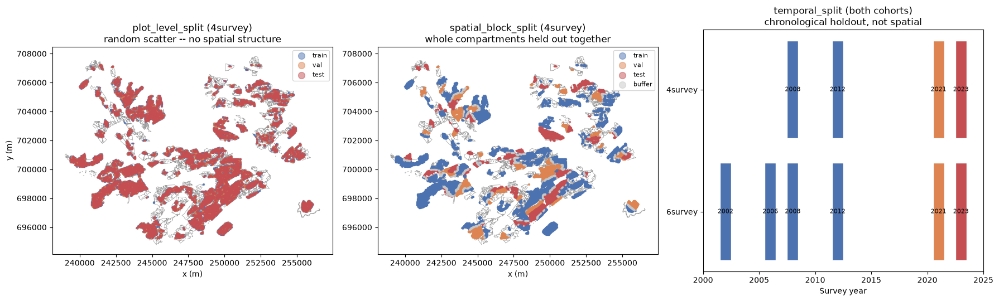

In [3]:
from models.common.geo import load_compartment_boundaries, load_plot_coordinates

SPLIT_COLORS = {
    "train": "#4c72b0", "val": "#dd8452", "test": "#c44e52",
    "buffer": "#c7c7c7", "unassigned": "#c7c7c7",
}


def split_assignment_path(cohort, split_type):
    if split_type in ("spatial_block", "temporal"):
        return project_root / "outputs" / split_type / "splits" / cohort / "split_assignment.csv"
    return project_root / "outputs" / "splits" / cohort / "split_assignment.csv"


def load_split_assignment(cohort, split_type):
    return pd.read_csv(split_assignment_path(cohort, split_type))


coordinates_df = load_plot_coordinates()
compartment_boundaries = load_compartment_boundaries()


def compartments_used_by(cohort):
    # Which compartments a cohort's data actually touches -- not the full
    # raw-GPKG survey grid (531 compartments, most never Sitka spruce or
    # never passing cleaning). spatial_block_split's assignment covers
    # every plot in the cohort regardless of train/val/test/buffer, and is
    # the same plot set plot_level_split uses for this cohort too, just
    # with different split labels -- so it's a reasonable stand-in for
    # 'every compartment this cohort's data touches' for either split map.
    plot_ids = load_split_assignment(cohort, "spatial_block")["identification"]
    used_cpmts = coordinates_df.loc[coordinates_df["identification"].isin(plot_ids), "cpmt"].unique()
    return compartment_boundaries[compartment_boundaries["cpmt"].isin(used_cpmts)]


def draw_survey_outline(ax, cohort):
    compartments_used_by(cohort).plot(ax=ax, facecolor="none", edgecolor="#999999", linewidth=0.5, zorder=0)


fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# Panel 1: plot_level_split -- one point per PLOT (split is constant across
# a plot's survey years for this split type, so de-duplicating by
# identification is safe and avoids plotting the same point 4x on top of
# itself).
plot_level_by_plot = load_split_assignment("4survey", "plot_level").drop_duplicates("identification")
plot_level_map = coordinates_df.merge(plot_level_by_plot[["identification", "split"]], on="identification")

draw_survey_outline(axes[0], "4survey")
for split_name, colour in SPLIT_COLORS.items():
    subset = plot_level_map[plot_level_map["split"] == split_name]
    if len(subset) > 0:
        axes[0].scatter(subset["x"], subset["y"], s=2, alpha=0.5, color=colour, label=split_name)
axes[0].set_title("plot_level_split (4survey)\nrandom scatter -- no spatial structure")
axes[0].set_xlabel("x (m)")
axes[0].set_ylabel("y (m)")
axes[0].legend(markerscale=6, fontsize=8)
axes[0].set_aspect("equal")

# Panel 2: spatial_block_split -- same de-duplication logic, whole
# compartments share one split so this is still safe.
spatial_by_plot = load_split_assignment("4survey", "spatial_block").drop_duplicates("identification")
spatial_map = coordinates_df.merge(spatial_by_plot[["identification", "split"]], on="identification")

draw_survey_outline(axes[1], "4survey")
for split_name, colour in SPLIT_COLORS.items():
    subset = spatial_map[spatial_map["split"] == split_name]
    if len(subset) > 0:
        axes[1].scatter(subset["x"], subset["y"], s=2, alpha=0.5, color=colour, label=split_name)
axes[1].set_title("spatial_block_split (4survey)\nwhole compartments held out together")
axes[1].set_xlabel("x (m)")
axes[1].legend(markerscale=6, fontsize=8)
axes[1].set_aspect("equal")

# Panel 3: temporal_split -- no spatial dimension to show, so this is a
# timeline instead of a map: which YEAR (not which plot) lands in which
# split, for both cohorts.
ax = axes[2]
cohort_y_positions = {"4survey": 1, "6survey": 0}
for cohort, y_pos in cohort_y_positions.items():
    year_to_split = (
        load_split_assignment(cohort, "temporal")
        .drop_duplicates("LiDAR_year")[["LiDAR_year", "split"]]
        .sort_values("LiDAR_year")
    )
    for _, row in year_to_split.iterrows():
        ax.barh(y_pos, 1, left=row["LiDAR_year"] - 0.5, color=SPLIT_COLORS[row["split"]], edgecolor="white")
        ax.text(row["LiDAR_year"], y_pos, str(row["LiDAR_year"]), ha="center", va="center", fontsize=8)

ax.set_yticks(list(cohort_y_positions.values()))
ax.set_yticklabels(list(cohort_y_positions.keys()))
ax.set_xlabel("Survey year")
ax.set_title("temporal_split (both cohorts)\nchronological holdout, not spatial")
ax.set_xlim(2000, 2025)

plt.tight_layout()
plt.show()

**Reading the plot**: `plot_level_split` (left) shows no spatial structure at all — train and test
plots are salt-and-pepper mixed across the whole forest, so a held-out plot is never far from a
training plot. `spatial_block_split` (middle) shows visible geographic clustering — whole regions
are held out together, so a test plot can be genuinely distant from anything the model trained on.
`temporal_split` (right) has no spatial dimension to show at all — every plot appears in every
coloured segment, just at a different survey year; what's held out is a slice of *time*, not a
slice of the forest. (6survey follows the same pattern as 4survey for the first two panels — not
shown here to keep this compact.)

## 4. `plot_level_split` — the four baselines (Chapman-Richards, average-by-age, linear regression, random forest)

The easiest of the three splits — individual plots shuffled randomly into train/val/test, so a
held-out plot usually sits right next to a training plot (section 3). DNN/PINN don't appear here,
by design.

In [3]:
SPLIT_TYPE = "plot_level"
MODEL_RUN_NAMES = models_for_split(SPLIT_TYPE)  # {display label: output-folder name}

split_metrics = {}
split_predictions = {}
for label, run_name in MODEL_RUN_NAMES.items():
    for cohort in COHORTS:
        split_metrics[(label, cohort)] = load_metrics(run_name, cohort, SPLIT_TYPE)
        split_predictions[(label, cohort)] = load_predictions(run_name, cohort, SPLIT_TYPE)

print(f"Loaded {len(MODEL_RUN_NAMES)} models x {len(COHORTS)} cohorts for split_type={SPLIT_TYPE!r}")

Loaded 4 models x 2 cohorts for split_type='plot_level'


### 4.1 Summary table and ranking

In [4]:
summary_rows = []
for cohort in COHORTS:
    for label in MODEL_RUN_NAMES:
        m = split_metrics[(label, cohort)]
        summary_rows.append({
            "cohort": cohort, "model": label, "n_test_rows": m["n"],
            "MAE": m["mae"], "RMSE": m["rmse"], "R2": m["r2"],
            "MRE": m["mre"], "Accuracy_pct": m["accuracy_pct"], "Bias": m["bias"],
        })

summary_df = pd.DataFrame(summary_rows)
display(summary_df.style.format({
    "MAE": "{:.4f}", "RMSE": "{:.4f}", "R2": "{:.4f}",
    "MRE": "{:.4f}", "Accuracy_pct": "{:.2f}", "Bias": "{:.4f}",
}))

for cohort in COHORTS:
    print(f"{cohort} -- ranked best to worst by RMSE:")
    cohort_rows = summary_df[summary_df["cohort"] == cohort].sort_values("RMSE")
    for rank, row in enumerate(cohort_rows.itertuples(), start=1):
        print(f"  {rank}. {row.model:<20} RMSE={row.RMSE:.3f}  MAE={row.MAE:.3f}  Bias={row.Bias:+.3f}")
    print()

,cohort,model,n_test_rows,MAE,RMSE,R2,MRE,Accuracy_pct,Bias
0,4survey,chapman_richards,46488,4.9543,6.2298,0.3943,0.3424,65.76,-0.0240
1,4survey,average_by_age,46488,4.7773,6.0491,0.4290,0.3292,67.08,0.0004
2,4survey,linear_baseline,46488,4.2692,5.3832,0.5478,0.2666,73.34,-0.0301
3,4survey,rf_baseline,46488,3.8996,5.2503,0.5698,0.2377,76.23,-0.0249
4,6survey,chapman_richards,16518,3.0423,4.4168,0.6275,0.2018,79.82,-0.1716
5,6survey,average_by_age,16518,2.7300,3.8990,0.7098,0.1827,81.73,-0.1033
6,6survey,linear_baseline,16518,3.3362,4.5334,0.6076,0.2180,78.20,-0.1064
7,6survey,rf_baseline,16518,2.8285,3.9515,0.7019,0.1776,82.24,-0.0414


4survey -- ranked best to worst by RMSE:
  1. rf_baseline          RMSE=5.250  MAE=3.900  Bias=-0.025
  2. linear_baseline      RMSE=5.383  MAE=4.269  Bias=-0.030
  3. average_by_age       RMSE=6.049  MAE=4.777  Bias=+0.000
  4. chapman_richards     RMSE=6.230  MAE=4.954  Bias=-0.024

6survey -- ranked best to worst by RMSE:
  1. average_by_age       RMSE=3.899  MAE=2.730  Bias=-0.103
  2. rf_baseline          RMSE=3.952  MAE=2.828  Bias=-0.041
  3. chapman_richards     RMSE=4.417  MAE=3.042  Bias=-0.172
  4. linear_baseline      RMSE=4.533  MAE=3.336  Bias=-0.106



**Caution on RF's strong numbers here.** Random forest looks like the best model, but this
evaluation is on `plot_level_split` — held-out plots still come from the same forest, same terrain
distribution, same general neighbourhoods as training. The prior dissertation this project extends
(Lynch, 2025) found RF scored highest accuracy in exactly this kind of intra-distribution setup,
but generalised very poorly once tested on genuinely unseen plots — new plots introduced unseen
feature combinations (elevation/slope/wind exposure) that RF's tree-split structure has no way to
interpolate between, unlike a network learning a smooth function. **Section 5 below runs the harder
test** (`spatial_block_split`, genuinely unseen compartments, all 6 models) — read that before
trusting the ranking above at face value.

### 4.2 Model comparison bar charts

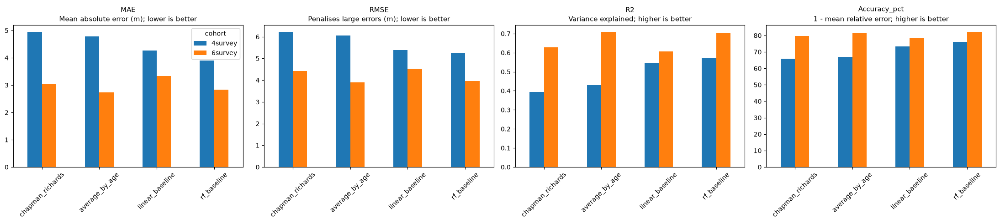

In [5]:
metrics_to_plot = ["MAE", "RMSE", "R2", "Accuracy_pct"]
metric_captions = {
    "MAE": "Mean absolute error (m); lower is better",
    "RMSE": "Penalises large errors (m); lower is better",
    "R2": "Variance explained; higher is better",
    "Accuracy_pct": "1 - mean relative error; higher is better",
}
model_order = list(MODEL_RUN_NAMES)

fig, axes = plt.subplots(1, len(metrics_to_plot), figsize=(22, 5))
for ax, metric_name in zip(axes, metrics_to_plot):
    pivoted = summary_df.pivot(index="model", columns="cohort", values=metric_name).loc[model_order]
    colors = [MODEL_COLORS[m] for m in model_order]
    pivoted.plot(kind="bar", ax=ax, color=colors, legend=(metric_name == metrics_to_plot[0]))
    ax.set_title(f"{metric_name}\n{metric_captions[metric_name]}", fontsize=11)
    ax.title.set_linespacing(1.4)
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

### 4.3 Predicted vs. observed, residuals, error-by-age

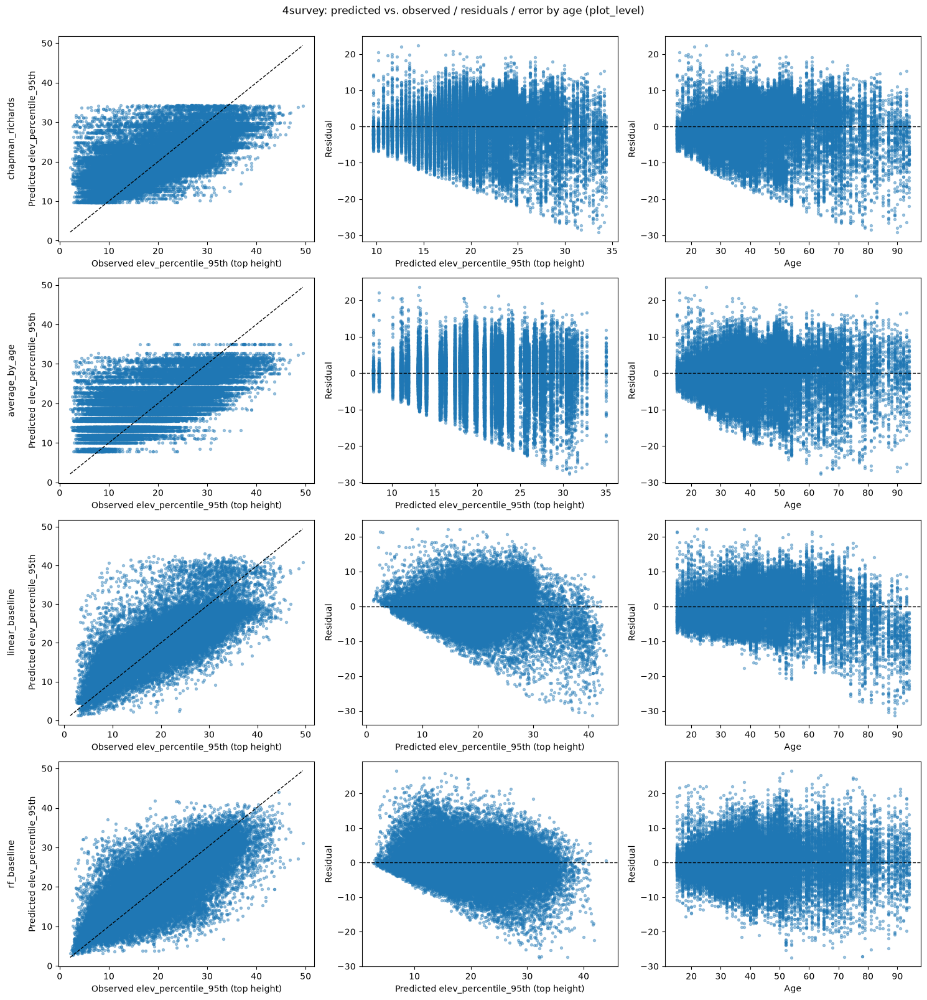

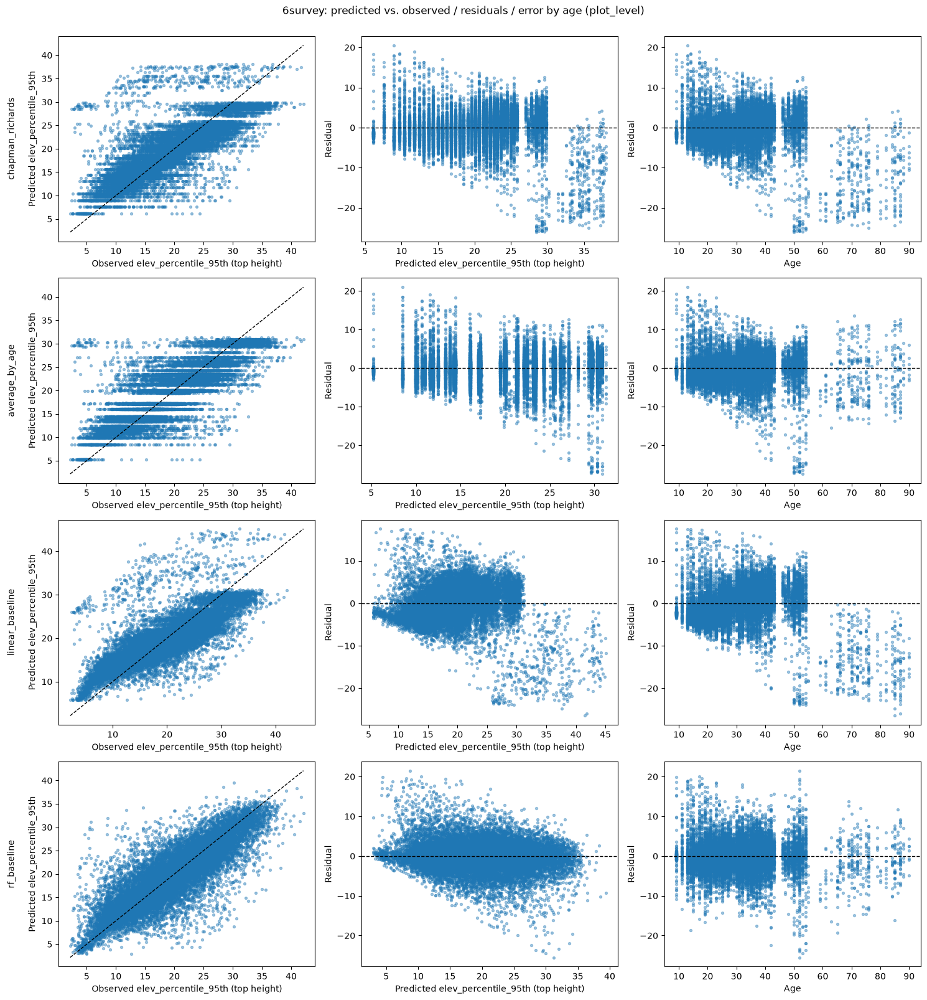

In [4]:
for cohort in COHORTS:
    fig, axes = plt.subplots(len(MODEL_RUN_NAMES), 3, figsize=(15, 4 * len(MODEL_RUN_NAMES)))
    fig.suptitle(f"{cohort}: predicted vs. observed / residuals / error by age ({SPLIT_TYPE})", y=1.001)

    for row, label in enumerate(MODEL_RUN_NAMES):
        predictions_df = split_predictions[(label, cohort)]
        observed = predictions_df["observed_top_height"]
        predicted = predictions_df["predicted_top_height"]
        age = predictions_df["Age"]

        plot_predicted_vs_observed(observed, predicted, ax=axes[row, 0])
        plot_residuals(observed, predicted, ax=axes[row, 1])
        plot_error_by_age(age, observed, predicted, ax=axes[row, 2])

        axes[row, 0].set_ylabel(f"{label}\n\nPredicted elev_percentile_95th")

    plt.tight_layout()
    plt.show()

**How to read the plot**
- **Predicted vs observed (left)**: hugging the diagonal = good fit; curvature away from it
  (flattening at high values) means the model can't reach the true range (linear models hit a ceiling).
- **Residuals vs predicted (middle)**: should be random noise centred at 0 with no shape. A shape
  (e.g. linear's arc) means the model can't bend to match a flattening curve.
- **Residual vs age (right)**: shows which ages a model breaks down at — e.g. linear and CR have
  negative residuals at older ages; RF neither over- nor under-predicts systematically.

### 4.4 Age-banded breakdown

MRE inflates on short/young plots since it divides by observed height, so a global MRE can look
worse than a model's real fit quality on mature plots — this separates that out.

,cohort,model,band,n_rows,MAE,RMSE,Bias,MRE
0,4survey,chapman_richards,<30,10124,3.357,4.359,-0.784,0.352
1,4survey,chapman_richards,30-40,14413,4.648,5.649,0.287,0.326
2,4survey,chapman_richards,40-60,16206,5.797,6.968,0.479,0.353
3,4survey,chapman_richards,60-80,4667,6.080,7.832,-0.299,0.338
4,4survey,chapman_richards,80+,1078,6.509,8.545,-3.404,0.329
5,6survey,chapman_richards,<30,7286,2.562,3.526,-0.542,0.222
6,6survey,chapman_richards,30-40,5642,2.764,3.644,0.420,0.139
7,6survey,chapman_richards,40-60,3236,3.587,5.144,0.957,0.208
8,6survey,chapman_richards,60-80,244,12.970,14.647,-12.943,0.809
9,6survey,chapman_richards,80+,110,11.083,13.065,-10.815,0.544


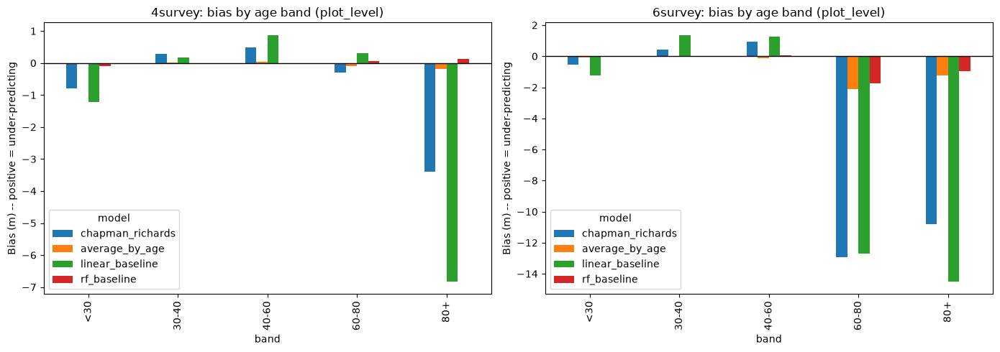

In [7]:
age_band_rows = []
for label in MODEL_RUN_NAMES:
    for cohort in COHORTS:
        for band in split_metrics[(label, cohort)].get("age_bands", []):
            age_band_rows.append({
                "cohort": cohort, "model": label, "band": band["band"], "n_rows": band["n_rows"],
                "MAE": band["mae"], "RMSE": band["rmse"], "Bias": band["bias"], "MRE": band["mre"],
            })

age_band_df = pd.DataFrame(age_band_rows)
display(age_band_df.style.format({"MAE": "{:.3f}", "RMSE": "{:.3f}", "Bias": "{:.3f}", "MRE": "{:.3f}"}))

fig, axes = plt.subplots(1, len(COHORTS), figsize=(14, 5))
for ax, cohort in zip(axes, COHORTS):
    cohort_bands = age_band_df[age_band_df["cohort"] == cohort]
    pivoted = cohort_bands.pivot(index="band", columns="model", values="Bias")
    band_order = [b for b in ["<30", "30-40", "40-60", "60-80", "80+"] if b in pivoted.index]
    pivoted = pivoted.loc[band_order, list(MODEL_RUN_NAMES)]
    colors = [MODEL_COLORS[m] for m in MODEL_RUN_NAMES]

    pivoted.plot(kind="bar", ax=ax, color=colors)
    ax.axhline(0, color="black", linewidth=1)
    ax.set_title(f"{cohort}: bias by age band ({SPLIT_TYPE})")
    ax.set_ylabel("Bias (m) -- positive = under-predicting")

plt.tight_layout()
plt.show()

**Reading the age bands**: every band clears the code's hard cutoff
(`MIN_ROWS_TO_TRUST_A_BAND = 30`), but clearing that bar doesn't mean every band is equally
trustworthy — 4survey's `40-60` band has 16,206 rows vs. `80+`'s 1,078, so by standard-error scaling
the `80+` band's numbers are roughly 3.9x noisier purely from sample size. Treat `30-40`/`40-60` as
solid, `60-80` as reasonably trustworthy, `80+` (especially in 6survey) as indicative, not precise.

**The `<30` band is a different kind of caveat, not just sample size.** Per forester
consultation (see `progress_notes.md`, "Age filter — resolved 15 July 2026"), an individual
LiDAR top-height measurement below ~30 isn't considered a reliable growth signal at all —
independent of any model's accuracy. These rows are real, included data (kept via a plot-level
maturity gate, not excluded from training/evaluation), but a large error here may reflect the
ground truth itself, not the model. Read this band as "what the data looks like," not "how the
model did."

### 4.5 Chapman-Richards fitted parameters vs. prior dissertation

The only model here with directly interpretable, checkable fitted parameters.

**Not a like-for-like comparison — the target definition changed twice since Lynch (2025)**:
Lynch's `y_max=46.1126` was fit on `Top_Height95` (`elev_percentile_95th × 1.1`, a forestry
correction for dense Sitka foliage underestimating true top height). This project's earlier
`Top_Height99` (`elev_percentile_99th`, no correction) was one change already; the 28-29 July
2026 rebuild changed the target again, to raw, unadjusted `elev_percentile_95th` — a third
variant, the one fit below. The `y_max` lower-bound bug fix (28-29 July 2026, see
`progress_notes.md`) is a separate, unrelated change to the fitting method, not the target. Any
gap between the values below and Lynch's `46.1126` is expected from these compounding definition
changes and shouldn't be read as fit instability or a substantive growth-ceiling difference.

In [8]:
PRIOR_CR_PARAMS = {"y_max": 46.1126, "k": 0.01866979, "p": 1.0175}

cr_param_rows = [{"cohort": "prior (Lynch, 2025)", **PRIOR_CR_PARAMS}]
for cohort in COHORTS:
    params_path = project_root / "outputs" / "chapman_richards" / cohort / "params.json"
    with open(params_path) as f:
        params = json.load(f)
    cr_param_rows.append({"cohort": cohort, "y_max": params["y_max"], "k": params["k"], "p": params["p"]})

cr_param_df = pd.DataFrame(cr_param_rows)
display(cr_param_df.style.format({"y_max": "{:.6f}", "k": "{:.8f}", "p": "{:.6f}"}))

,cohort,y_max,k,p
0,"prior (Lynch, 2025)",46.112600,0.01866979,1.017500
1,4survey,51.963071,0.01028790,0.864899
2,6survey,44.458530,0.02333811,1.193388


### 4.6 Growth curves and the survey-year confound

Every baseline is fit **once** on the whole pooled training set across all survey years (a single
`curve_fit`/`LinearRegression().fit()` call), producing one Age -> Height relationship applied
identically whether a row came from 2008 or 2023. But the same age band is measurably taller in
later surveys (e.g. 4survey age-30 plots average ~16m in 2008 vs. ~22m in 2023) — a single pooled
curve can't bend to fit both eras, so it settles in between and is biased at the extremes.

Left panel: each model's predictions (black) over observed points, coloured by survey year — a
colour sitting mostly above/below black at a given age means that year is where the fit is biased.
Right panel: the same effect as a number, mean bias per survey year.

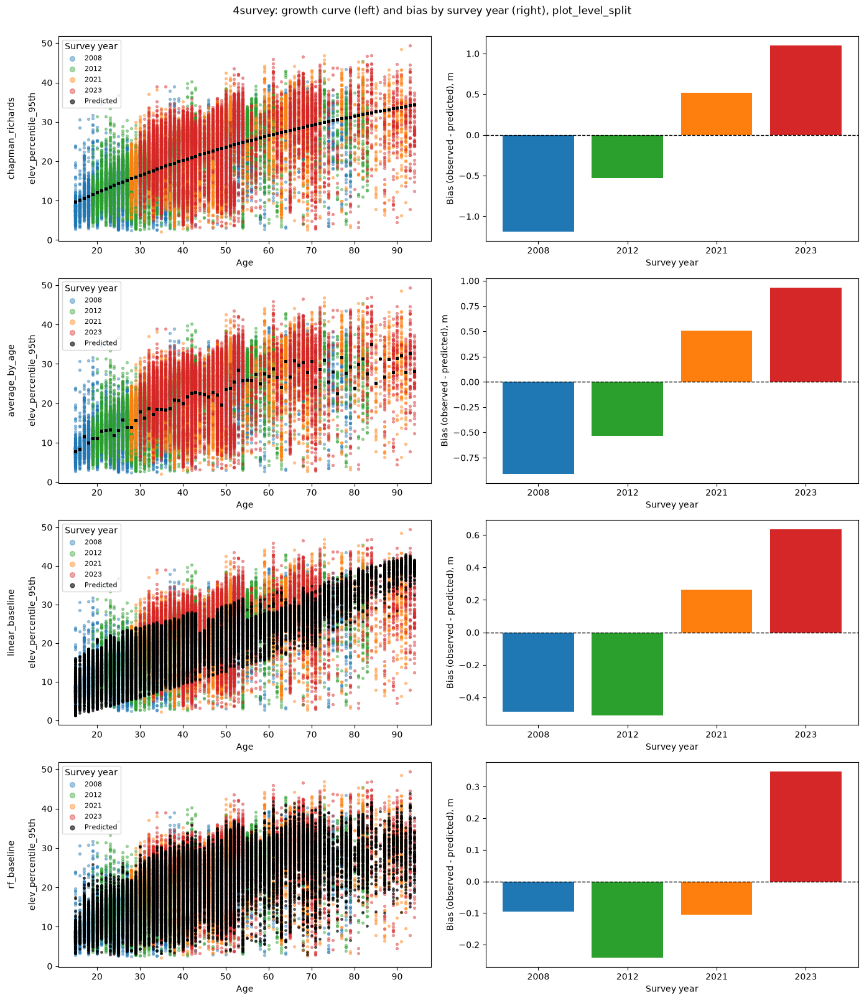

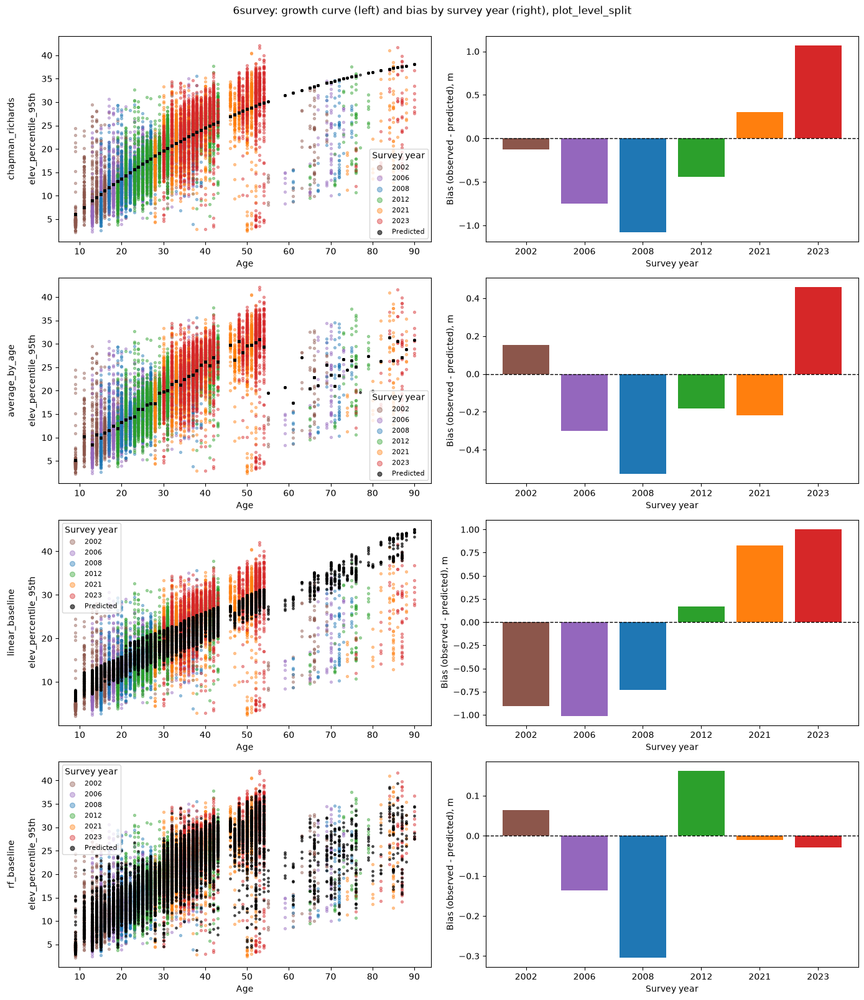

In [5]:
for cohort in COHORTS:
    fig, axes = plt.subplots(len(MODEL_RUN_NAMES), 2, figsize=(14, 4 * len(MODEL_RUN_NAMES)))
    fig.suptitle(f"{cohort}: growth curve (left) and bias by survey year (right), plot_level_split", y=1.001)

    for row, label in enumerate(MODEL_RUN_NAMES):
        predictions_df = split_predictions[(label, cohort)]
        observed = predictions_df["observed_top_height"]
        predicted = predictions_df["predicted_top_height"]
        age = predictions_df["Age"]
        lidar_year = predictions_df["LiDAR_year"]

        plot_growth_curve(age, observed, predicted, lidar_year, ax=axes[row, 0])
        plot_bias_by_year(lidar_year, observed, predicted, ax=axes[row, 1])

        axes[row, 0].set_ylabel(f"{label}\n\nelev_percentile_95th")

    plt.tight_layout()
    plt.show()

Every baseline here is Age-only, so this pattern is the ceiling on what an Age-only model can
ever achieve — none of them sees anything that could distinguish 2008 from 2023. **DNN/PINN are
also age-only** (no environmental features yet), so section 5.5 checks whether they reproduce the
same pattern under `spatial_block_split` — expected to, since they have no more information than
these baselines do about which year a row came from. The shrinkage that matters happens once
environmental features are added (Env-PINN) — that's the actual result to watch for later.

### 4.7 How big is the year effect, in metres? (diagnostic only)

**Fixed and re-run, 2026-07-30**: the previous caveat here was that
`year_effect_diagnostic.py` had the exact degenerate `y_max` lower bound already fixed in
the main CR fit (`= max_observed_height`, not `× 1.001`) -- that's now fixed, and
`run_year_effect_diagnostic.py` also gained a `--split-type` argument it never had (it was
hardwired to `plot_level`, so this confound had never actually been checked under
`spatial_block_split`, the dissertation's primary split). The numbers below are freshly
computed against the current pipeline, `plot_level` split (matching the rest of section 4) --
the `spatial_block` equivalent found a comparable magnitude (1.15%/5.83% for 4survey/6survey,
vs. 1.80%/3.95% here), suggesting this confound isn't sensitive to which split is used.

cohort,4survey,6survey
year,,
2002,+nan,+0.000
2006,+nan,-2.472
2008,+0.000,-2.901
2012,+2.137,-0.916
2021,+5.229,+1.277
2023,+6.634,+2.718


,cohort,reference_year,plain_cr_sse,year_effect_sse,pct_squared_error_explained_by_year
0,4survey,2008,"5,508,368","5,409,004",1.80%
1,6survey,2002,"893,922","858,624",3.95%


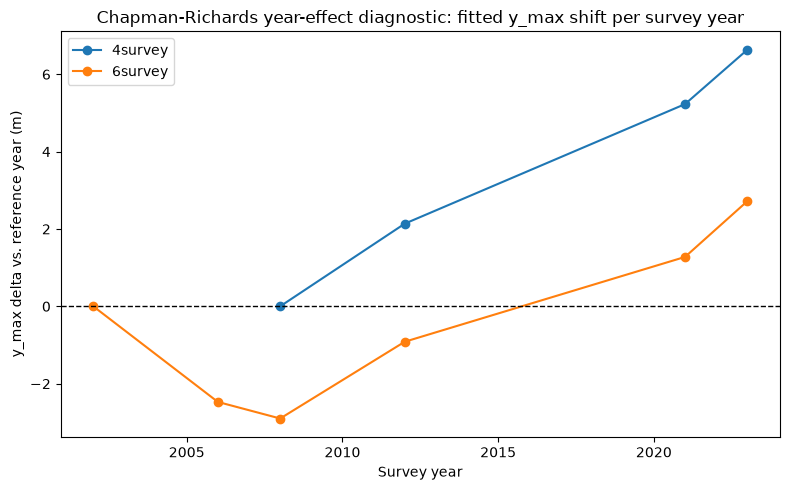

In [3]:
year_diagnostic_rows = []
year_delta_rows = []

for cohort in COHORTS:
    diagnostic_path = project_root / "outputs" / "chapman_richards_year_diagnostic" / cohort / "params.json"
    with open(diagnostic_path) as f:
        diagnostic = json.load(f)

    for year, delta in diagnostic["year_deltas"].items():
        year_delta_rows.append({"cohort": cohort, "year": int(year), "y_max_delta": delta})

    year_diagnostic_rows.append({
        "cohort": cohort,
        "reference_year": diagnostic["reference_year"],
        "plain_cr_sse": diagnostic["plain_cr_sum_squared_error"],
        "year_effect_sse": diagnostic["sum_squared_error"],
        "pct_squared_error_explained_by_year": diagnostic["variance_explained_by_year_pct"],
    })

year_delta_df = pd.DataFrame(year_delta_rows)
year_diagnostic_df = pd.DataFrame(year_diagnostic_rows)

display(year_delta_df.pivot(index="year", columns="cohort", values="y_max_delta").style.format("{:+.3f}"))
display(year_diagnostic_df.style.format({
    "plain_cr_sse": "{:,.0f}", "year_effect_sse": "{:,.0f}", "pct_squared_error_explained_by_year": "{:.2f}%",
}))

fig, ax = plt.subplots(figsize=(8, 5))
for cohort in COHORTS:
    cohort_deltas = year_delta_df[year_delta_df["cohort"] == cohort].sort_values("year")
    ax.plot(cohort_deltas["year"], cohort_deltas["y_max_delta"], marker="o", label=cohort)

ax.axhline(0, color="black", linewidth=1, linestyle="--")
ax.set_xlabel("Survey year")
ax.set_ylabel("y_max delta vs. reference year (m)")
ax.set_title("Chapman-Richards year-effect diagnostic: fitted y_max shift per survey year")
ax.legend()
plt.tight_layout()
plt.show()

**In plain terms**: trees of the same age are taller in later surveys — about 6.6m taller
comparing 2008 to 2023 in 4survey. That's real, not noise. But it explains only **1.80% of
squared error in 4survey and 3.95% in 6survey** (plot_level; a comparable 1.15%/5.83% under
spatial_block, the primary split, checked for the first time 2026-07-30) — real but small;
most of the error comes from something else this diagnostic doesn't measure (e.g. some
plots just naturally grow better than others regardless of year). **Why this matters for the
PINN**: if adding environmental data only fixes this year issue, error should only drop
1-6%. A bigger drop means the environmental data is fixing something bigger — most likely
telling apart good growing sites from bad ones. This is a concrete, quantified bar
Env-PINN's eventual improvement needs to clear before crediting it to "fixed the year
confound."

## 5. `spatial_block_split` — all six models (the dissertation's primary split)

Whole forestry compartments held out together, with a 60m buffer — a test plot's nearest training
neighbour can be kilometres away. This is where DNN and PINN enter the comparison, and it's the
split that actually tests the dissertation's central question: static, per-plot environmental
covariates (terrain, wind) can only ever explain *spatial* variation, not temporal, so this is the
split built to detect it. PINN here uses the tuned, weight-swept config (`pw=tw=0.05` — see 5.3).

**Currency flag (2026-07-30)**: the table and charts below are a cached run that predates the
2026-07-28 baseline rebuild — every number shown, baselines included, is from the retired
`Top_Height99`+`yldc` pipeline. Rebuilt baseline outputs already exist on disk
(`outputs/spatial_block/{chapman_richards,average_by_age,linear_baseline,rf_baseline}/`) but
haven't been used to refresh this cell yet. DNN/PINN's rebuilt `spatial_block` outputs don't
exist yet at all — that cluster re-run is still in progress (see section 9) — so re-executing
this notebook now would refresh the baseline rows but fail loading DNN/PINN's metrics until it
lands.

In [12]:
SPLIT_TYPE = "spatial_block"
MODEL_RUN_NAMES = models_for_split(SPLIT_TYPE)  # {display label: output-folder name}

split_metrics = {}
split_predictions = {}
for label, run_name in MODEL_RUN_NAMES.items():
    for cohort in COHORTS:
        split_metrics[(label, cohort)] = load_metrics(run_name, cohort, SPLIT_TYPE)
        split_predictions[(label, cohort)] = load_predictions(run_name, cohort, SPLIT_TYPE)

print(f"Loaded {len(MODEL_RUN_NAMES)} models x {len(COHORTS)} cohorts for split_type={SPLIT_TYPE!r}")

Loaded 6 models x 2 cohorts for split_type='spatial_block'


### 5.1 Summary table and ranking

In [13]:
summary_rows = []
for cohort in COHORTS:
    for label in MODEL_RUN_NAMES:
        m = split_metrics[(label, cohort)]
        summary_rows.append({
            "cohort": cohort, "model": label, "n_test_rows": m["n"],
            "MAE": m["mae"], "RMSE": m["rmse"], "R2": m["r2"],
            "MRE": m["mre"], "Accuracy_pct": m["accuracy_pct"], "Bias": m["bias"],
        })

summary_df = pd.DataFrame(summary_rows)
display(summary_df.style.format({
    "MAE": "{:.4f}", "RMSE": "{:.4f}", "R2": "{:.4f}",
    "MRE": "{:.4f}", "Accuracy_pct": "{:.2f}", "Bias": "{:.4f}",
}))

for cohort in COHORTS:
    print(f"{cohort} -- ranked best to worst by RMSE:")
    cohort_rows = summary_df[summary_df["cohort"] == cohort].sort_values("RMSE")
    for rank, row in enumerate(cohort_rows.itertuples(), start=1):
        print(f"  {rank}. {row.model:<20} RMSE={row.RMSE:.3f}  MAE={row.MAE:.3f}  Bias={row.Bias:+.3f}")
    print()

,cohort,model,n_test_rows,MAE,RMSE,R2,MRE,Accuracy_pct,Bias
0,4survey,chapman_richards,46972,4.8678,6.1073,0.4211,0.2501,74.99,1.8347
1,4survey,average_by_age,46972,5.1136,6.3476,0.3746,0.2598,74.02,2.1719
2,4survey,linear_baseline,46972,4.6116,5.8167,0.4748,0.2451,75.49,-0.1271
3,4survey,rf_baseline,46972,4.5342,5.9884,0.4434,0.2356,76.44,0.0644
4,4survey,dnn_noenv,46972,3.7808,5.0185,0.6091,0.2003,79.97,-0.0000
5,4survey,pinn_noenv (tuned),46972,3.8613,5.1209,0.5930,0.2019,79.81,0.4080
6,6survey,chapman_richards,16686,2.8585,3.9668,0.6969,0.1583,84.17,0.0401
7,6survey,average_by_age,16686,2.6862,3.8915,0.7083,0.1516,84.84,-0.2269
8,6survey,linear_baseline,16686,3.1483,4.0865,0.6784,0.1831,81.69,-0.3420
9,6survey,rf_baseline,16686,3.2668,4.6040,0.5918,0.1947,80.53,-0.9975


4survey -- ranked best to worst by RMSE:
  1. dnn_noenv            RMSE=5.019  MAE=3.781  Bias=-0.000
  2. pinn_noenv (tuned)   RMSE=5.121  MAE=3.861  Bias=+0.408
  3. linear_baseline      RMSE=5.817  MAE=4.612  Bias=-0.127
  4. rf_baseline          RMSE=5.988  MAE=4.534  Bias=+0.064
  5. chapman_richards     RMSE=6.107  MAE=4.868  Bias=+1.835
  6. average_by_age       RMSE=6.348  MAE=5.114  Bias=+2.172

6survey -- ranked best to worst by RMSE:
  1. pinn_noenv (tuned)   RMSE=3.627  MAE=2.526  Bias=-0.368
  2. dnn_noenv            RMSE=3.650  MAE=2.572  Bias=-0.461
  3. average_by_age       RMSE=3.892  MAE=2.686  Bias=-0.227
  4. chapman_richards     RMSE=3.967  MAE=2.859  Bias=+0.040
  5. linear_baseline      RMSE=4.086  MAE=3.148  Bias=-0.342
  6. rf_baseline          RMSE=4.604  MAE=3.267  Bias=-0.997



### 5.2 Model comparison bar charts

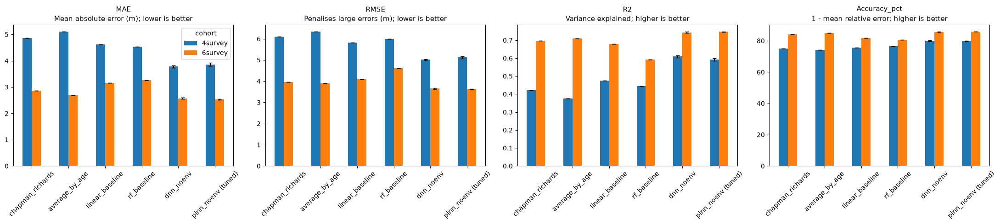

In [14]:
metrics_to_plot = ["MAE", "RMSE", "R2", "Accuracy_pct"]
metric_captions = {
    "MAE": "Mean absolute error (m); lower is better",
    "RMSE": "Penalises large errors (m); lower is better",
    "R2": "Variance explained; higher is better",
    "Accuracy_pct": "1 - mean relative error; higher is better",
}
model_order = list(MODEL_RUN_NAMES)

fig, axes = plt.subplots(1, len(metrics_to_plot), figsize=(22, 5))
for ax, metric_name in zip(axes, metrics_to_plot):
    pivoted = summary_df.pivot(index="model", columns="cohort", values=metric_name).loc[model_order]
    colors = [MODEL_COLORS[m] for m in model_order]

    # Error bars: real seed-to-seed std for DNN/PINN, 0 (invisible) for
    # anything never reseeded -- see metric_seed_std() in the setup cell.
    error_df = pd.DataFrame(
        {cohort: [metric_seed_std(model, cohort, SPLIT_TYPE, metric_name) for model in model_order]
         for cohort in pivoted.columns},
        index=model_order,
    )

    pivoted.plot(kind="bar", ax=ax, color=colors, yerr=error_df, capsize=3, legend=(metric_name == metrics_to_plot[0]))
    ax.set_title(f"{metric_name}\n{metric_captions[metric_name]}", fontsize=11)
    ax.title.set_linespacing(1.4)
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

**RF loses its `plot_level_split` advantage here — DNN and PINN don't.** RF was the best of the
four baselines under the easy split (section 4); here it has the largest RMSE degradation of any
baseline (+28.7% in 4survey, +19.4% in 6survey — see section 7 for the full degradation view). DNN
and PINN both land below every baseline's RMSE in both cohorts, including RF's best case.

*(Error bars above show the real seed-to-seed std for DNN/PINN where reseeded; baselines have none — they were never checked for seed variance.)*

**This is not a clean PINN win over DNN — and a multi-seed reseed check (2026-07-20) shows it's
less "mixed" and more one-sided than it first looked.** DNN wins 4survey robustly (confirmed across
3 seeds, both splits). The apparent "PINN wins 6survey" is NOT confirmed — reseeding shows PINN
beats DNN in only 2 of 3 seeds, by under 0.2% RMSE either way, which is noise, not a real
difference (see `baseline_models_parameter_tuning.ipynb` section 10 for the full reseed table). The
honest summary: **DNN wins 4survey; DNN and PINN are statistically tied on 6survey.** PINN's actual
demonstrated advantage remains *training stability* (no overfitting collapses across any tested
configuration, confirmed across every reseed too), not lower error anywhere. The accuracy story
here is closer to "a trainable neural network beats fixed-form baselines" than "the physics
constraint wins" — see 5.3.

### 5.3 How we got to this PINN configuration (brief — full detail in `baseline_models_parameter_tuning.ipynb`)

1. **First real run** (2026-07-16): default hyperparameters, `physics_weight = trajectory_weight = 1.0`
   — never tested against any other value. PINN RMSE 5.49 / 3.72.
2. **Hyperparameter tuning** (loosened patience, larger batch size, weight decay, gradient
   clipping, smoothed early-stopping): trained roughly 2x longer, but final RMSE barely moved —
   confirmed the untuned numbers were already close to genuine convergence, not a premature stop.
   RMSE 5.46 / 3.70.
3. **Physics/trajectory-weight sweep** (7 values, 0.0-5.0): found the untested default of `1.0`
   was actively hurting accuracy on both cohorts — weaker is better, monotonically, down to physics
   fully off for 4survey. Chose `pw=tw=0.05` as a shared default (6survey's actual optimum, only
   0.7% worse than 4survey's own optimum). RMSE 5.12 / 3.63 — the number above, and the first time
   PINN beats DNN on 6survey.

| Stage | 4survey RMSE | 6survey RMSE |
|---|---|---|
| First run (`pw=tw=1.0`, untuned) | 5.4862 | 3.7153 |
| + tuned hyperparameters (`pw=tw=1.0`) | 5.4642 | 3.7039 |
| + weight sweep, chosen `pw=tw=0.05` | 5.1209 | 3.6265 |

**Why the physics term hurt at full strength**: Chapman-Richards uses one global `y_max` for every
plot — forcing the network to match that single curve as strongly as it matches real observed
heights fights against real plot-to-plot variation, which is exactly the variation this
dissertation exists to explain (see section 8). See `experiment_log.md`'s 2026-07-17 Findings
entries for the full reasoning chain.

### 5.4 Predicted vs. observed, residuals, error-by-age

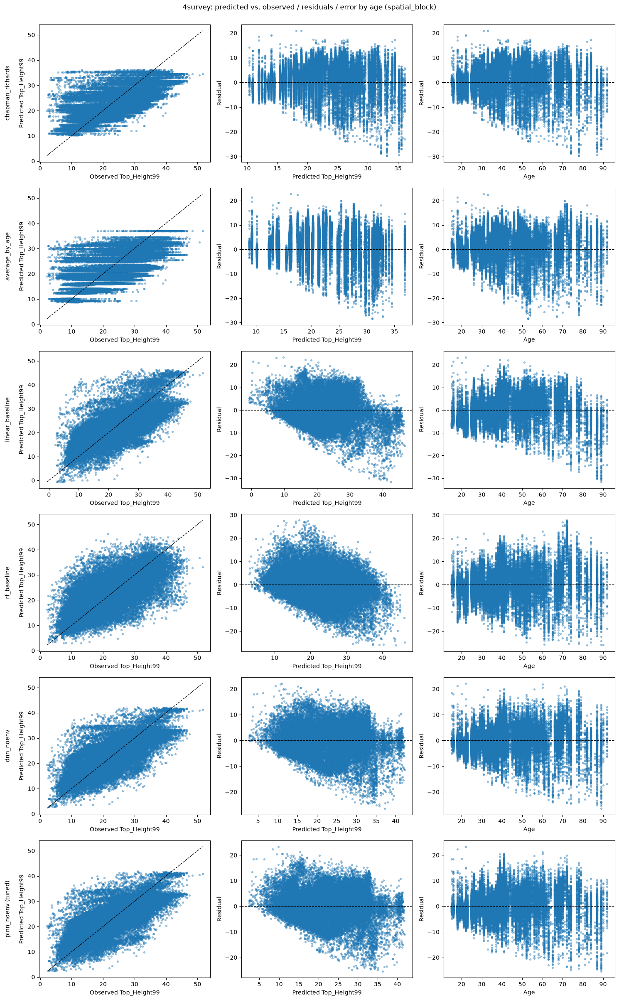

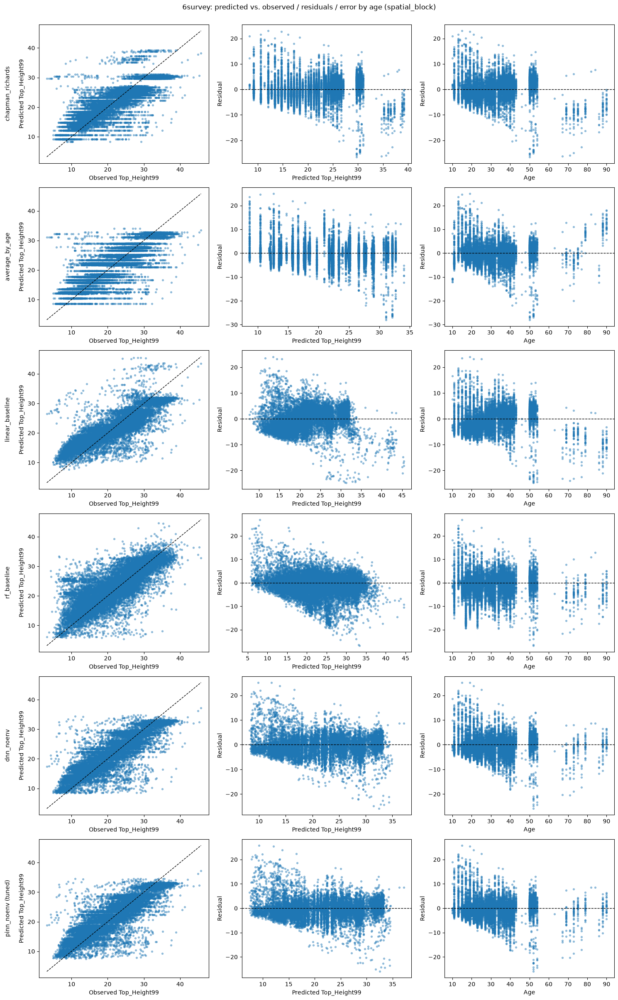

In [15]:
for cohort in COHORTS:
    fig, axes = plt.subplots(len(MODEL_RUN_NAMES), 3, figsize=(15, 4 * len(MODEL_RUN_NAMES)))
    fig.suptitle(f"{cohort}: predicted vs. observed / residuals / error by age ({SPLIT_TYPE})", y=1.001)

    for row, label in enumerate(MODEL_RUN_NAMES):
        predictions_df = split_predictions[(label, cohort)]
        observed = predictions_df["observed_top_height"]
        predicted = predictions_df["predicted_top_height"]
        age = predictions_df["Age"]

        plot_predicted_vs_observed(observed, predicted, ax=axes[row, 0])
        plot_residuals(observed, predicted, ax=axes[row, 1])
        plot_error_by_age(age, observed, predicted, ax=axes[row, 2])

        axes[row, 0].set_ylabel(f"{label}\n\nPredicted elev_percentile_95th")

    plt.tight_layout()
    plt.show()

### 5.5 Age-banded breakdown

,cohort,model,band,n_rows,MAE,RMSE,Bias,MRE
0,4survey,chapman_richards,20-40,25134,3.873,4.801,1.951,0.210
1,4survey,chapman_richards,40-60,14030,6.487,7.588,2.543,0.313
2,4survey,chapman_richards,60-80,4648,5.851,7.388,1.049,0.254
3,4survey,chapman_richards,80+,1276,6.207,8.330,-2.063,0.276
4,6survey,chapman_richards,20-40,10148,2.563,3.423,-0.267,0.139
5,6survey,chapman_richards,40-60,3547,3.194,4.399,1.615,0.136
6,6survey,chapman_richards,60-80,144,9.818,10.557,-9.660,0.427
7,6survey,chapman_richards,80+,72,7.280,8.039,-6.871,0.244
8,4survey,average_by_age,20-40,25134,4.264,5.192,2.445,0.228
9,4survey,average_by_age,40-60,14030,6.459,7.720,2.128,0.314


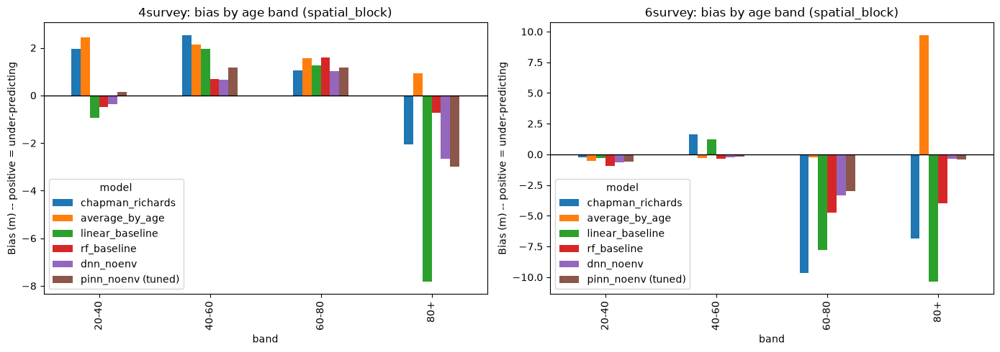

In [16]:
age_band_rows = []
for label in MODEL_RUN_NAMES:
    for cohort in COHORTS:
        for band in split_metrics[(label, cohort)].get("age_bands", []):
            age_band_rows.append({
                "cohort": cohort, "model": label, "band": band["band"], "n_rows": band["n_rows"],
                "MAE": band["mae"], "RMSE": band["rmse"], "Bias": band["bias"], "MRE": band["mre"],
            })

age_band_df = pd.DataFrame(age_band_rows)
display(age_band_df.style.format({"MAE": "{:.3f}", "RMSE": "{:.3f}", "Bias": "{:.3f}", "MRE": "{:.3f}"}))

fig, axes = plt.subplots(1, len(COHORTS), figsize=(14, 5))
for ax, cohort in zip(axes, COHORTS):
    cohort_bands = age_band_df[age_band_df["cohort"] == cohort]
    pivoted = cohort_bands.pivot(index="band", columns="model", values="Bias")
    band_order = [b for b in ["<30", "30-40", "40-60", "60-80", "80+"] if b in pivoted.index]
    pivoted = pivoted.loc[band_order, list(MODEL_RUN_NAMES)]
    colors = [MODEL_COLORS[m] for m in MODEL_RUN_NAMES]

    pivoted.plot(kind="bar", ax=ax, color=colors)
    ax.axhline(0, color="black", linewidth=1)
    ax.set_title(f"{cohort}: bias by age band ({SPLIT_TYPE})")
    ax.set_ylabel("Bias (m) -- positive = under-predicting")

plt.tight_layout()
plt.show()

### 5.6 Growth curves and the survey-year confound — do DNN/PINN show the same pattern?

Both are still age-only (no environmental features), same as every baseline — neither has any
input that could distinguish a 2008 row from a 2023 row at the same age. Expectation: they should
show the *same* survey-year bias pattern as the baselines (section 4.6), not an improvement — that
only shows up once environmental features are added. This is the honest "before" picture Env-PINN
needs to beat.

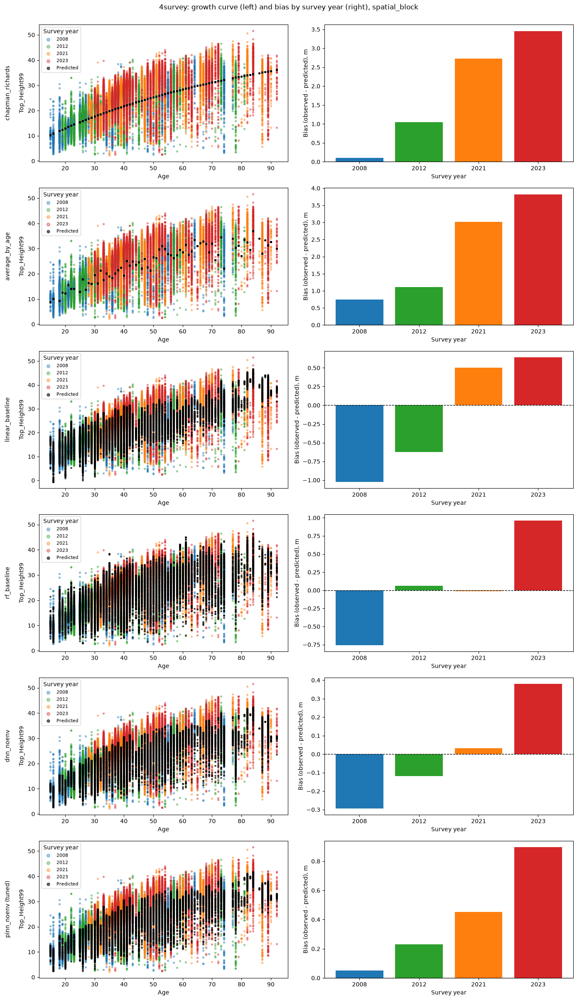

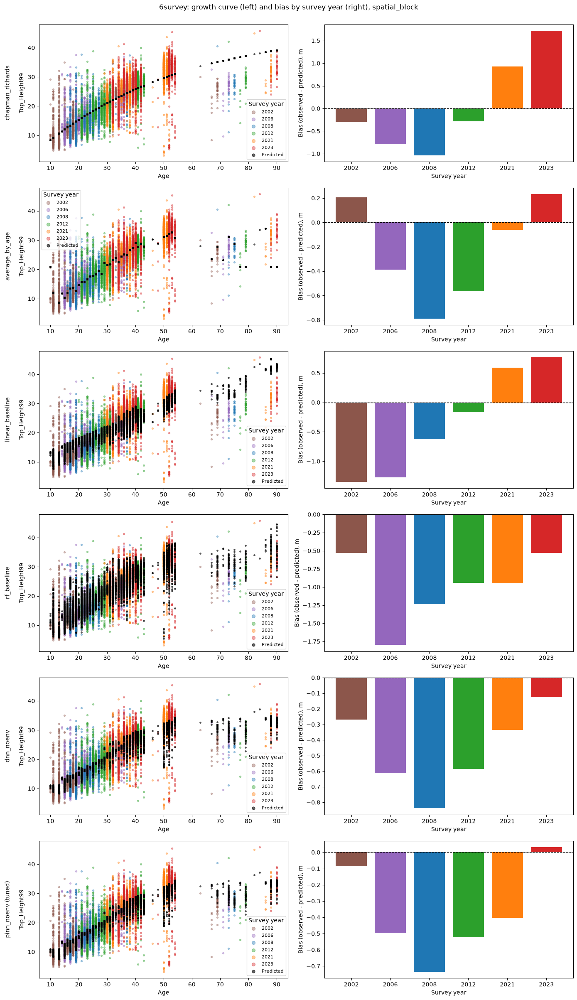

In [17]:
for cohort in COHORTS:
    fig, axes = plt.subplots(len(MODEL_RUN_NAMES), 2, figsize=(14, 4 * len(MODEL_RUN_NAMES)))
    fig.suptitle(f"{cohort}: growth curve (left) and bias by survey year (right), {SPLIT_TYPE}", y=1.001)

    for row, label in enumerate(MODEL_RUN_NAMES):
        predictions_df = split_predictions[(label, cohort)]
        observed = predictions_df["observed_top_height"]
        predicted = predictions_df["predicted_top_height"]
        age = predictions_df["Age"]
        lidar_year = predictions_df["LiDAR_year"]

        plot_growth_curve(age, observed, predicted, lidar_year, ax=axes[row, 0])
        plot_bias_by_year(lidar_year, observed, predicted, ax=axes[row, 1])

        axes[row, 0].set_ylabel(f"{label}\n\nelev_percentile_95th")

    plt.tight_layout()
    plt.show()

### 5.7 Spatial maps of prediction error — all six models

One point per test plot, averaged across its survey years, coloured by mean residual (observed −
predicted). Same colour scale across all six panels per cohort, so panels are directly comparable.

**How to read this**: **red** = model *under*-predicted there (real trees taller than the model
guessed); **blue** = *over*-predicted; pale/white = accurate. What actually matters is whether
colour *clusters geographically* rather than scattering randomly — clustering (a whole region
consistently red or blue) means the model is systematically wrong in that specific place, pointing
at something location-specific (terrain, wind, drainage) explaining real growth differences the
model can't see yet — exactly the evidence the environmental-feature chapter needs. A random
scatter with no regional pattern means the errors are closer to generic noise. Compare panels: does
RF's documented spatial fragility (5.2 above) actually show up as more clustered/blotchy colouring
than CR's or DNN/PINN's, not just larger on average? Do all six models struggle in the *same*
places (a genuinely hard region, model-independent) or different places (model-specific weaknesses)?

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


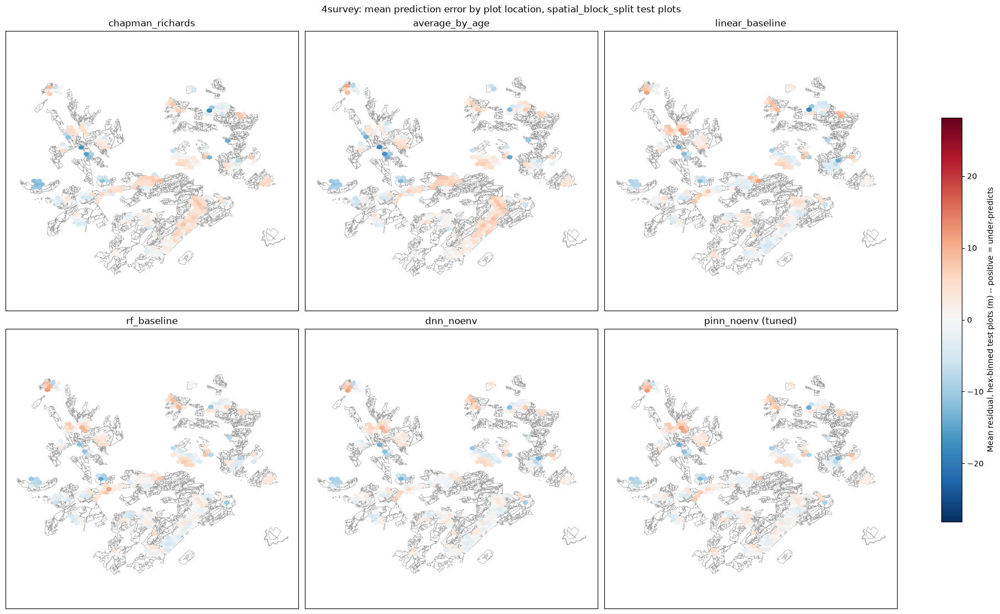

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


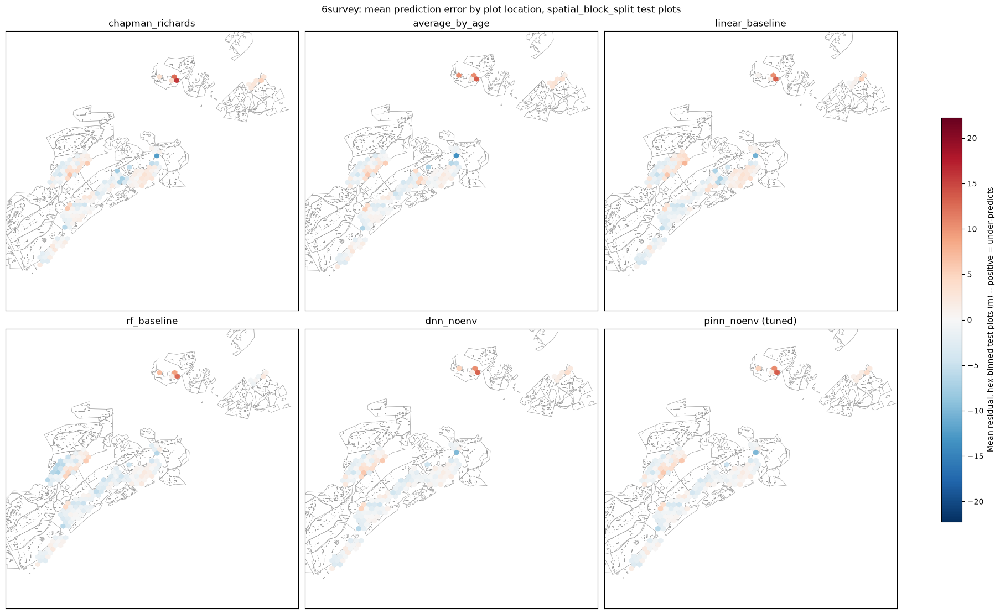

In [18]:
# gridsize chosen 2026-07-20 by comparing hexbin gridsize 30/45/60/80 on
# RF baseline's spatial_block/4survey residuals -- 45 was the best trade-off
# between "visible at forest-wide zoom" and "still tracks real spatial
# clusters". hexbin (not scatter) is required here, not just a style choice:
# at this zoom a marker is much wider than the ~20-40m spacing between test
# plots in a held-out compartment, so every plot overlaps a neighbour and an
# opaque scatter shows whichever point drew LAST, not their average -- 
# checked on RF/4survey: 27% of overlapping patches had the last-drawn point
# showing the opposite SIGN from the true mean residual there. hexbin
# computes a real per-bin mean, so it isn't subject to draw-order bias.
HEXBIN_GRIDSIZE = 45


for cohort in COHORTS:
    merged_by_model = {}
    for label in MODEL_RUN_NAMES:
        predictions_df = split_predictions[(label, cohort)]
        test_only = predictions_df[predictions_df["split"] == "test"]
        mean_residual = test_only.groupby("identification")["residual"].mean().reset_index()
        merged_by_model[label] = coordinates_df.merge(mean_residual, on="identification")

    max_abs_residual = max(merged["residual"].abs().max() for merged in merged_by_model.values())

    # Same bounding box for every panel (not each auto-scaling to its own
    # points) -- otherwise a model with fewer/tighter test points looks
    # "zoomed in" rather than genuinely different, which isn't a fair
    # comparison across models.
    all_x = pd.concat([m["x"] for m in merged_by_model.values()])
    all_y = pd.concat([m["y"] for m in merged_by_model.values()])
    x_lim, y_lim = (all_x.min(), all_x.max()), (all_y.min(), all_y.max())

    # constrained_layout (not tight_layout) is what actually avoids overlap
    # here -- it accounts for the shared colorbar and the equal-aspect
    # constraint together, which tight_layout doesn't know how to do.
    # adjustable="datalim" (not the "equal" default of adjustable="box")
    # is what stops each panel shrinking to leave whitespace -- it fills
    # the panel's box and extends the display range instead.
    fig, axes = plt.subplots(2, 3, figsize=(18, 11), constrained_layout=True)
    fig.suptitle(f"{cohort}: mean prediction error by plot location, spatial_block_split test plots")
    mappable = None
    for ax, label in zip(axes.flat, MODEL_RUN_NAMES):
        merged = merged_by_model[label]
        draw_survey_outline(ax, cohort)
        mappable = ax.hexbin(
            merged["x"], merged["y"], C=merged["residual"], gridsize=HEXBIN_GRIDSIZE,
            extent=(x_lim[0], x_lim[1], y_lim[0], y_lim[1]), cmap="RdBu_r",
            vmin=-max_abs_residual, vmax=max_abs_residual, mincnt=1, linewidths=0.2, zorder=2,
        )
        ax.set_title(label)
        ax.set_xlim(x_lim)
        ax.set_ylim(y_lim)
        ax.set_aspect("equal", adjustable="datalim")
        ax.set_xticks([])
        ax.set_yticks([])

    fig.colorbar(mappable, ax=axes, shrink=0.7, label="Mean residual, hex-binned test plots (m) -- positive = under-predicts")
    plt.show()

**Interpretive follow-up, 2026-07-30 (partial -- 4 of 6 models)**: the "same error clusters
across all six models" claim stated elsewhere in this notebook was never actually anchored to
specific compartments or numbers -- this does that, for the four baseline models that already
have current, post-rebuild residuals (DNN/PINN's spatial_block residuals aren't back from the
cluster yet, see section 9 -- this analysis should be re-run with all six once they land).

In [3]:
from models.spatial_attribution.data import load_residuals

per_model_residual = {}
cpmt_by_plot = None
for model_name in BASELINE_MODEL_NAMES:
    model_plots = load_residuals(model_name, cohort="4survey", split_type="spatial_block")
    per_model_residual[model_name] = model_plots.set_index("identification")["residual"]
    if cpmt_by_plot is None:
        cpmt_by_plot = model_plots.set_index("identification")["cpmt"]

combined_residuals = pd.DataFrame(per_model_residual)
combined_residuals["cpmt"] = cpmt_by_plot

compartment_means = combined_residuals.groupby("cpmt")[BASELINE_MODEL_NAMES].mean()
compartment_n_plots = combined_residuals.groupby("cpmt").size()

# Same trust threshold used for the age-banded breakdown elsewhere (MIN_ROWS_TO_TRUST_A_BAND=30) --
# a compartment needs at least this many test plots before its mean residual is worth reading.
MIN_PLOTS_TO_TRUST_A_COMPARTMENT = 30
well_supported = compartment_n_plots >= MIN_PLOTS_TO_TRUST_A_COMPARTMENT

# "All models agree" = every one of the four baselines shows the same sign (all over-predicting,
# or all under-predicting) in that compartment -- not just a similar magnitude.
n_positive = (compartment_means[BASELINE_MODEL_NAMES] > 0).sum(axis=1)
all_models_agree = (n_positive == len(BASELINE_MODEL_NAMES)) | (n_positive == 0)

consistent_compartments = compartment_means[well_supported & all_models_agree].copy()
consistent_compartments["n_test_plots"] = compartment_n_plots[well_supported & all_models_agree]
consistent_compartments["mean_abs_bias"] = consistent_compartments[BASELINE_MODEL_NAMES].abs().mean(axis=1)
consistent_compartments = consistent_compartments.sort_values("mean_abs_bias", ascending=False)

print(f"{well_supported.sum()} compartments have >= {MIN_PLOTS_TO_TRUST_A_COMPARTMENT} test plots; "
      f"{all_models_agree[well_supported].sum()} of those show all four baselines biased the same direction.")
print("\nStrongest, best-supported consistent-bias compartments:")
display(consistent_compartments.head(10).style.format({
    **{m: "{:+.2f}" for m in BASELINE_MODEL_NAMES}, "mean_abs_bias": "{:.2f}",
}))

Joined on 'identification': 11,743 matched rows
Loaded 11,743 plots with a real chapman_richards residual (4survey, spatial_block, test split only)
Joined on 'identification': 11,743 matched rows
Loaded 11,743 plots with a real average_by_age residual (4survey, spatial_block, test split only)


Joined on 'identification': 11,743 matched rows
Loaded 11,743 plots with a real linear_baseline residual (4survey, spatial_block, test split only)
Joined on 'identification': 11,743 matched rows
Loaded 11,743 plots with a real rf_baseline residual (4survey, spatial_block, test split only)
43 compartments have >= 30 test plots; 28 of those show all four baselines biased the same direction.

Strongest, best-supported consistent-bias compartments:


,chapman_richards,average_by_age,linear_baseline,rf_baseline,n_test_plots,mean_abs_bias
cpmt,,,,,,
2070,-12.86,-14.21,-6.50,-6.79,34,10.09
2094,-11.23,-9.51,-8.84,-6.00,279,8.89
2111,-8.02,-9.07,-3.93,-5.21,98,6.55
2042,+4.58,+6.45,+7.24,+6.94,38,6.30
1034,+5.74,+5.93,+6.38,+5.30,111,5.84
1095,+7.77,+6.13,+6.50,+2.26,126,5.67
1027,+4.26,+3.37,+5.52,+6.73,56,4.97
1074,+4.91,+3.27,+6.74,+4.52,128,4.86
2128,+4.16,+4.52,+5.68,+3.32,149,4.42


**Reading this**: compartment 2094 (279 test plots -- the best-supported case, not a small-
sample fluke) shows every baseline over-predicting by roughly 9-14m on average; compartment 2070
(34 plots) is similarly biased but with far less support. Several other compartments
(1034/1095/1027/1074/2128/1080) show the opposite pattern -- consistent UNDER-prediction. That
roughly half of well-supported compartments (28 of 43) show a consistent direction across four
structurally very different baselines (a fixed growth curve, a lookup table, a linear model, a
random forest) is itself evidence the pattern is a real location effect, not a model-specific
quirk -- exactly the kind of signal terrain/wind attribution is meant to explain. **Still
open**: this is 4 of 6 models; the claim needs re-checking once DNN/PINN's current-pipeline
residuals exist, since a genuinely more flexible model could behave differently here.

## 6. `temporal_split` — all six models (secondary split)

Train on the earliest years, validate on 2021, test on 2023 — a real 11-year extrapolation, not a
spatial holdout. A real, separate research question (does the model generalise across time), but
not the dissertation's central one (see section 3) — so this section is intentionally lighter than
section 5: summary and ranking only, not the full diagnostic suite, to keep this notebook from
tripling every chart. PINN here uses the same shared `pw=tw=0.05` weight chosen for `spatial_block`
— the weight sweep has now been run under `temporal` too (see 6.3), and the shared default is kept
for consistency across splits even though the per-cohort optimum shifts slightly here.

**Currency flag (2026-07-30)**: same caveat as section 5 — this table is a cached, pre-rebuild
run; DNN/PINN's rebuilt `temporal` outputs aren't back from the cluster yet (see section 9).

In [19]:
SPLIT_TYPE = "temporal"
MODEL_RUN_NAMES = models_for_split(SPLIT_TYPE)  # {display label: output-folder name}

split_metrics = {}
split_predictions = {}
for label, run_name in MODEL_RUN_NAMES.items():
    for cohort in COHORTS:
        split_metrics[(label, cohort)] = load_metrics(run_name, cohort, SPLIT_TYPE)
        split_predictions[(label, cohort)] = load_predictions(run_name, cohort, SPLIT_TYPE)

print(f"Loaded {len(MODEL_RUN_NAMES)} models x {len(COHORTS)} cohorts for split_type={SPLIT_TYPE!r}")

Loaded 6 models x 2 cohorts for split_type='temporal'


### 6.1 Summary table and ranking

In [20]:
summary_rows = []
for cohort in COHORTS:
    for label in MODEL_RUN_NAMES:
        m = split_metrics[(label, cohort)]
        summary_rows.append({
            "cohort": cohort, "model": label, "n_test_rows": m["n"],
            "MAE": m["mae"], "RMSE": m["rmse"], "R2": m["r2"],
            "MRE": m["mre"], "Accuracy_pct": m["accuracy_pct"], "Bias": m["bias"],
        })

summary_df = pd.DataFrame(summary_rows)
display(summary_df.style.format({
    "MAE": "{:.4f}", "RMSE": "{:.4f}", "R2": "{:.4f}",
    "MRE": "{:.4f}", "Accuracy_pct": "{:.2f}", "Bias": "{:.4f}",
}))

for cohort in COHORTS:
    print(f"{cohort} -- ranked best to worst by RMSE:")
    cohort_rows = summary_df[summary_df["cohort"] == cohort].sort_values("RMSE")
    for rank, row in enumerate(cohort_rows.itertuples(), start=1):
        print(f"  {rank}. {row.model:<20} RMSE={row.RMSE:.3f}  MAE={row.MAE:.3f}  Bias={row.Bias:+.3f}")
    print()

,cohort,model,n_test_rows,MAE,RMSE,R2,MRE,Accuracy_pct,Bias
0,4survey,chapman_richards,58112,6.4299,7.6140,0.0771,0.3144,68.56,2.0663
1,4survey,average_by_age,58112,7.2308,8.8097,-0.2355,0.3423,65.77,2.7137
2,4survey,linear_baseline,58112,5.1206,6.3467,0.3587,0.2471,75.29,1.0070
3,4survey,rf_baseline,58112,6.1362,7.8073,0.0296,0.2922,70.78,1.2761
4,4survey,dnn_noenv,58112,4.6059,5.8600,0.4533,0.2267,77.33,0.4497
5,4survey,pinn_noenv (tuned),58112,4.7098,5.9348,0.4393,0.2291,77.09,0.7830
6,6survey,chapman_richards,13769,4.7331,5.7482,0.0178,0.1946,80.54,2.8271
7,6survey,average_by_age,13769,7.7393,9.8104,-1.8609,0.2759,72.41,6.2099
8,6survey,linear_baseline,13769,5.6200,6.9397,-0.4316,0.2151,78.49,3.9216
9,6survey,rf_baseline,13769,4.1798,5.3494,0.1493,0.1759,82.41,1.6822


4survey -- ranked best to worst by RMSE:
  1. dnn_noenv            RMSE=5.860  MAE=4.606  Bias=+0.450
  2. pinn_noenv (tuned)   RMSE=5.935  MAE=4.710  Bias=+0.783
  3. linear_baseline      RMSE=6.347  MAE=5.121  Bias=+1.007
  4. chapman_richards     RMSE=7.614  MAE=6.430  Bias=+2.066
  5. rf_baseline          RMSE=7.807  MAE=6.136  Bias=+1.276
  6. average_by_age       RMSE=8.810  MAE=7.231  Bias=+2.714

6survey -- ranked best to worst by RMSE:
  1. pinn_noenv (tuned)   RMSE=4.891  MAE=3.671  Bias=+0.955
  2. dnn_noenv            RMSE=4.939  MAE=3.743  Bias=+1.231
  3. rf_baseline          RMSE=5.349  MAE=4.180  Bias=+1.682
  4. chapman_richards     RMSE=5.748  MAE=4.733  Bias=+2.827
  5. linear_baseline      RMSE=6.940  MAE=5.620  Bias=+3.922
  6. average_by_age       RMSE=9.810  MAE=7.739  Bias=+6.210



### 6.2 Model comparison bar charts

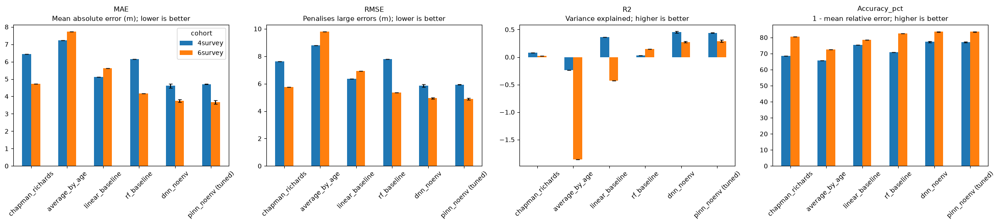

In [21]:
metrics_to_plot = ["MAE", "RMSE", "R2", "Accuracy_pct"]
metric_captions = {
    "MAE": "Mean absolute error (m); lower is better",
    "RMSE": "Penalises large errors (m); lower is better",
    "R2": "Variance explained; higher is better",
    "Accuracy_pct": "1 - mean relative error; higher is better",
}
model_order = list(MODEL_RUN_NAMES)

fig, axes = plt.subplots(1, len(metrics_to_plot), figsize=(22, 5))
for ax, metric_name in zip(axes, metrics_to_plot):
    pivoted = summary_df.pivot(index="model", columns="cohort", values=metric_name).loc[model_order]
    colors = [MODEL_COLORS[m] for m in model_order]

    # Error bars: real seed-to-seed std for DNN/PINN, 0 (invisible) for
    # anything never reseeded -- see metric_seed_std() in the setup cell.
    error_df = pd.DataFrame(
        {cohort: [metric_seed_std(model, cohort, SPLIT_TYPE, metric_name) for model in model_order]
         for cohort in pivoted.columns},
        index=model_order,
    )

    pivoted.plot(kind="bar", ax=ax, color=colors, yerr=error_df, capsize=3, legend=(metric_name == metrics_to_plot[0]))
    ax.set_title(f"{metric_name}\n{metric_captions[metric_name]}", fontsize=11)
    ax.title.set_linespacing(1.4)
    ax.set_xlabel("")
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

*(Error bars above show the real seed-to-seed std for DNN/PINN where reseeded; baselines have none.)*

**Temporal generalization degrades far more than spatial, for every model — see section 7 for the
full degradation comparison.** Two things specific to this split: **Chapman-Richards is the most
temporally robust of the four baselines** (its single smooth sigmoid, constrained to one asymptote,
extrapolates to a future survey more gracefully than a lookup table, a straight line, or an
unconstrained tree ensemble) — the direct empirical motivation for building the PINN in the first
place, since its physics term is built from this same curve. **DNN's 4survey result carries a real
caveat**: its loss curve shows an overfitting climb that hyperparameter tuning only softened, not
fixed (`best_epoch` stayed very early even after tuning) — a data-design limit (only 2 distinct
training years for 4survey), not something more tuning budget would solve. **`temporal_narrow_gap`
(a shorter, easier extrapolation gap) answers whether this is specific to the 11-year gap length —
see 6.4.**

### 6.3 How we got to this PINN configuration (weight sweep, run under `temporal`)

The physics/trajectory-weight sweep (7 values, 0.0-5.0) was originally only run under
`spatial_block` (see 5.3). Re-run here under `temporal` (2026-07-18, both cohorts):

| W | 4survey RMSE / R² | 6survey RMSE / R² |
|---|---|---|
| 0.0 | 5.9091 / 0.4441 | 4.9217 / 0.2800 |
| 0.05 | 5.9348 / 0.4393 | 4.8915 / 0.2888 |
| 0.1 | 5.9487 / 0.4366 | 4.8615 / 0.2974 |
| 0.2 | 6.0596 / 0.4155 | **4.8294 / 0.3067** |
| 0.5 | 6.0902 / 0.4095 | 4.9593 / 0.2689 |
| 1.0 (old default) | 6.0870 / 0.4101 | 4.8857 / 0.2904 |
| 5.0 | 6.3373 / 0.3606 | 5.0375 / 0.2457 |
| DNN (reference) | 5.8600 / 0.4533 | 4.9388 / 0.2749 |

**4survey's optimum is again `W=0.0` (physics fully off)**, monotonically worse as `W` increases —
the same pattern as `spatial_block`. **6survey's optimum has shifted to `W≈0.1–0.2`**, not
`spatial_block`'s `W=0.05` — a small but real divergence, cross-checked against `best_val_loss`
(the validation-only, physics-free loss component, so this isn't test-set cherry-picking): the
same broad ranking holds there too (`W=5.0` clearly worst for both cohorts; `W=0.1`/`0.2` rank
above `W=1.0` for 6survey in both RMSE and val_loss).

**One honest nuance temporal has that spatial_block didn't**: going from the old `W=1.0` default to
the chosen shared `W=0.05` actually costs 6survey a hair of accuracy here (4.8915 vs. 4.8857, a
+0.12% RMSE change — noise-level, but not an improvement), even though it clearly helps 4survey
(6.0870 → 5.9348, −2.5%). Under `spatial_block`, `W=0.05` was a clear win for both cohorts; under
`temporal`, it's a clear win for one and a wash for the other.

| Stage | 4survey RMSE | 6survey RMSE |
|---|---|---|
| Original run (`pw=tw=1.0`, tuned) | 6.0870 | 4.8857 |
| + weight sweep, kept shared `pw=tw=0.05` | 5.9348 | 4.8915 |

**Decision: keep the shared `pw=tw=0.05` default rather than add a second, temporal-specific
weight.** Same reasoning as `spatial_block`: one PINN configuration is a more defensible claim in
the write-up than a per-split-tuned pair, and the cost of the shared value is small everywhere it's
been tested (4survey pays 0.4% vs. its own temporal optimum; 6survey pays 1.3% vs. its own). This
becomes the new reference "temporal PINN" number, superseding the untested `pw=tw=1.0` default used
until now — the numbers throughout section 6 above already reflect this. What this does **not**
settle: whether `W=0.05` still holds once Env-PINN's environmental sub-network changes what `y_max`
means (flagged in `experiment_log.md`, not assumed to carry over).

### 6.4 `temporal_narrow_gap`: is the 11-year gap itself the problem? (2026-07-20)

`temporal_split` (above) trains on the earliest years only and tests 11 years later —
deliberately the harder extrapolation (see section 3). `temporal_narrow_gap` trains through 2021
instead, a 2-year gap to the same 2023 test set — same models, same everything else, just a much
shorter jump into the future. This answers a specific question: is the large degradation seen
above (section 6.2, e.g. `average_by_age`'s 6survey R² going negative) caused by *any* future
prediction being hard, or specifically by the 11-year distance? Full detail, including a
non-obvious bug this split's year-assignment caught (PINN's trajectory loss needs a
chronologically adjacent training pair, not just "any two pre-test years"), lives in
`baseline_models_parameter_tuning.ipynb` section 11 — this is the compact version.

Deliberately a **minimal pass**, not a repeat of section 6.3's full weight-sweep treatment:
baselines fit as-is, DNN/PINN each run once at the already-established tuned settings and shared
`pw=tw=0.05` default, not re-tuned or re-swept for this split specifically.

In [22]:
NARROW_GAP_SPLIT = "temporal_narrow_gap"
narrow_gap_rows = []
for label, run_name in models_for_split(NARROW_GAP_SPLIT).items():
    for cohort in COHORTS:
        wide_metrics = load_metrics(models_for_split("temporal")[label], cohort, "temporal")
        narrow_metrics = load_metrics(run_name, cohort, NARROW_GAP_SPLIT)
        narrow_gap_rows.append({
            "model": label, "cohort": cohort,
            "wide_gap_RMSE": wide_metrics["rmse"], "narrow_gap_RMSE": narrow_metrics["rmse"],
            "pct_change": (narrow_metrics["rmse"] - wide_metrics["rmse"]) / wide_metrics["rmse"] * 100,
        })

narrow_gap_df = pd.DataFrame(narrow_gap_rows)
narrow_gap_df["gap_narrows_degradation"] = narrow_gap_df["pct_change"] < 0
display(narrow_gap_df.style.format({
    "wide_gap_RMSE": "{:.4f}", "narrow_gap_RMSE": "{:.4f}", "pct_change": "{:+.1f}%",
}))

n_confirming = narrow_gap_df["gap_narrows_degradation"].sum()
print(f"{n_confirming} of {len(narrow_gap_df)} model/cohort combinations show LOWER RMSE under "
      f"the shorter gap.")

,model,cohort,wide_gap_RMSE,narrow_gap_RMSE,pct_change,gap_narrows_degradation
0,chapman_richards,4survey,7.6140,7.4061,-2.7%,True
1,chapman_richards,6survey,5.7482,5.3033,-7.7%,True
2,average_by_age,4survey,8.8097,8.9546,+1.6%,False
3,average_by_age,6survey,9.8104,6.3280,-35.5%,True
4,linear_baseline,4survey,6.3467,5.9608,-6.1%,True
5,linear_baseline,6survey,6.9397,5.1612,-25.6%,True
6,rf_baseline,4survey,7.8073,6.7115,-14.0%,True
7,rf_baseline,6survey,5.3494,5.1223,-4.2%,True
8,dnn_noenv,4survey,5.8600,5.2814,-9.9%,True
9,dnn_noenv,6survey,4.9388,4.3445,-12.0%,True


11 of 12 model/cohort combinations show LOWER RMSE under the shorter gap.


**Result: 11 of 12 model/cohort combinations improve under the shorter gap** — baselines and
DNN/PINN alike. `average_by_age`'s 6survey case is the most dramatic (+141.7% degradation under
the 11-year gap vs. +55.9% under the 2-year gap — still bad, but much less so). DNN and PINN both
improve by 10-12% RMSE moving from the wide to the narrow gap, on both cohorts. The one
near-exception is 4survey's `average_by_age` (a lookup table has no extrapolation mechanism
regardless of gap length, so this isn't surprising).

**This is the answer to section 6.2's open question**: the large `temporal_split` degradation is
substantially explained by *how far* into the future the test set sits, not by "temporal
prediction is inherently hard" for these models. This validates `temporal_split`'s 11-year gap as
the right choice for the dissertation's primary temporal test — it measures genuine extrapolation
difficulty, not an artefact of these particular years.

**One thing this does NOT establish**: which of DNN/PINN "wins" under `temporal_narrow_gap`
(4survey: PINN very marginally ahead; 6survey: DNN very marginally ahead) — both margins are under
1% and, per section 8's Key Finding 2, margins this size have already been shown to be
seed-to-seed noise rather than a real difference. Not re-litigated here with only one seed each.

## 7. Does error get worse under the harder splits, and for which models?

This section is baselines-only, not because DNN/PINN are excluded on purpose, but because
**percent change needs a `plot_level_split` number to change *from*** — DNN/PINN don't have one
(section 3). Their raw numbers under `spatial_block`/`temporal` are already in sections 5-6 directly.

`pct_change` is `(harder_split − plot_level) / plot_level * 100` — positive means the model got
*worse* than its easy-split baseline.

In [23]:
SPLIT_TYPES = ["plot_level", "spatial_block", "temporal"]

baseline_generalization_metrics = {}
for split_type in SPLIT_TYPES:
    for cohort in COHORTS:
        for model_name in BASELINE_MODEL_NAMES:
            baseline_generalization_metrics[(model_name, cohort, split_type)] = load_metrics(
                model_name, cohort, split_type
            )

comparison_rows = []
for cohort in COHORTS:
    for model_name in BASELINE_MODEL_NAMES:
        plot_m = baseline_generalization_metrics[(model_name, cohort, "plot_level")]
        spatial_m = baseline_generalization_metrics[(model_name, cohort, "spatial_block")]
        temporal_m = baseline_generalization_metrics[(model_name, cohort, "temporal")]
        comparison_rows.append({
            "cohort": cohort,
            "model": model_name,
            "plot_level_RMSE": plot_m["rmse"],
            "spatial_block_RMSE": spatial_m["rmse"],
            "spatial_pct_change": (spatial_m["rmse"] - plot_m["rmse"]) / plot_m["rmse"] * 100,
            "temporal_RMSE": temporal_m["rmse"],
            "temporal_pct_change": (temporal_m["rmse"] - plot_m["rmse"]) / plot_m["rmse"] * 100,
        })

comparison_df = pd.DataFrame(comparison_rows)
display(comparison_df.style.format({
    "plot_level_RMSE": "{:.3f}", "spatial_block_RMSE": "{:.3f}", "spatial_pct_change": "{:+.1f}%",
    "temporal_RMSE": "{:.3f}", "temporal_pct_change": "{:+.1f}%",
}).background_gradient(subset=["spatial_pct_change", "temporal_pct_change"], cmap="RdYlGn_r", vmin=-15, vmax=140))

,cohort,model,plot_level_RMSE,spatial_block_RMSE,spatial_pct_change,temporal_RMSE,temporal_pct_change
0,4survey,chapman_richards,6.441,6.107,-5.2%,7.614,+18.2%
1,4survey,average_by_age,6.259,6.348,+1.4%,8.810,+40.8%
2,4survey,linear_baseline,5.338,5.817,+9.0%,6.347,+18.9%
3,4survey,rf_baseline,4.653,5.988,+28.7%,7.807,+67.8%
4,6survey,chapman_richards,4.568,3.967,-13.2%,5.748,+25.8%
5,6survey,average_by_age,4.060,3.892,-4.1%,9.810,+141.7%
6,6survey,linear_baseline,4.514,4.086,-9.5%,6.940,+53.7%
7,6survey,rf_baseline,3.855,4.604,+19.4%,5.349,+38.8%


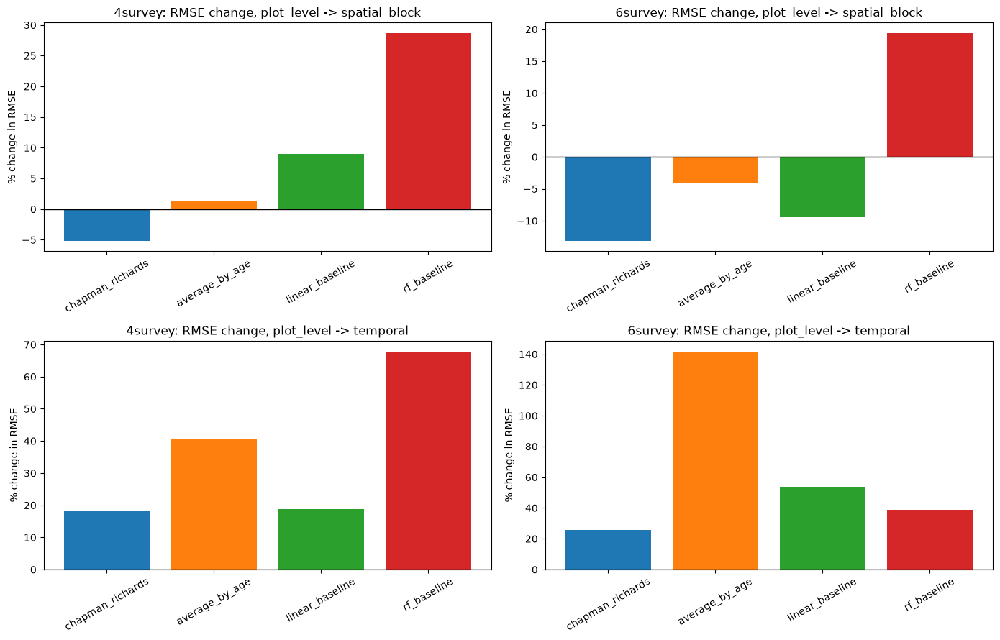

In [24]:
fig, axes = plt.subplots(2, len(COHORTS), figsize=(14, 9))

for col, cohort in enumerate(COHORTS):
    cohort_rows = comparison_df[comparison_df["cohort"] == cohort].set_index("model").loc[BASELINE_MODEL_NAMES]

    ax_spatial = axes[0, col]
    ax_spatial.bar(cohort_rows.index, cohort_rows["spatial_pct_change"], color=[MODEL_COLORS[m] for m in BASELINE_MODEL_NAMES])
    ax_spatial.axhline(0, color="black", linewidth=1)
    ax_spatial.set_title(f"{cohort}: RMSE change, plot_level -> spatial_block")
    ax_spatial.set_ylabel("% change in RMSE")
    ax_spatial.tick_params(axis="x", rotation=30)

    ax_temporal = axes[1, col]
    ax_temporal.bar(cohort_rows.index, cohort_rows["temporal_pct_change"], color=[MODEL_COLORS[m] for m in BASELINE_MODEL_NAMES])
    ax_temporal.axhline(0, color="black", linewidth=1)
    ax_temporal.set_title(f"{cohort}: RMSE change, plot_level -> temporal")
    ax_temporal.set_ylabel("% change in RMSE")
    ax_temporal.tick_params(axis="x", rotation=30)

plt.tight_layout()
plt.show()

**Spatial generalization**: RF has the largest degradation of the four baselines in both cohorts
(+28.7% / +19.4%), while CR and average-by-age stay flat or improve. The precise, defensible claim:
**RF loses its `plot_level_split` advantage faster than the other three baselines when tested on
genuinely unseen compartments** — a real, partial replication of Lynch's finding, though not yet
proof of their specific *terrain-interpolation* mechanism (no elevation/slope/wind features exist
yet).

**Temporal generalization is a much bigger effect, and it inverts the ranking.** Every model
degrades far more under `temporal` than `spatial_block` — 6survey's `average_by_age` degrades
+141.7% and its R² goes negative (worse than predicting the mean). RF is comparatively more
temporal-robust than spatial-robust (a lookup table and a straight line have no extrapolation
mechanism at all; RF's tree splits and CR's smooth curve both have *some*). **Chapman-Richards is
the most temporally robust baseline** (+18.2%/+25.8%, smallest degradation of the four) despite
being the simplest — the direct empirical motivation for the PINN (section 8).

### 7.1 Where does RF's degradation concentrate? Age-banded RMSE, all three splits

RF is the model of interest for spatial degradation above, so this checks whether it's spread
evenly across ages or concentrated in particular bands.

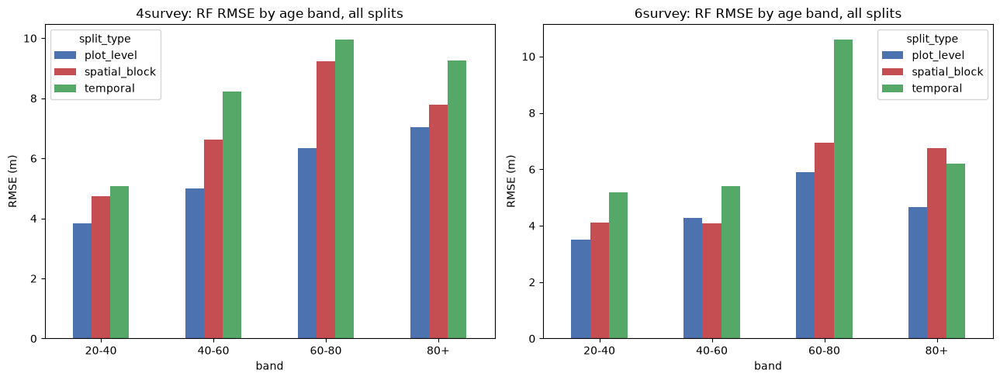

In [25]:
rf_band_rows = []
for cohort in COHORTS:
    for split_type in SPLIT_TYPES:
        for band in baseline_generalization_metrics[("rf_baseline", cohort, split_type)].get("age_bands", []):
            rf_band_rows.append({
                "cohort": cohort, "split_type": split_type, "band": band["band"],
                "n_rows": band["n_rows"], "RMSE": band["rmse"], "Bias": band["bias"],
            })

rf_band_df = pd.DataFrame(rf_band_rows)

fig, axes = plt.subplots(1, len(COHORTS), figsize=(13, 5))
for ax, cohort in zip(axes, COHORTS):
    cohort_bands = rf_band_df[rf_band_df["cohort"] == cohort]
    pivoted = cohort_bands.pivot(index="band", columns="split_type", values="RMSE")
    band_order = [b for b in ["<30", "30-40", "40-60", "60-80", "80+"] if b in pivoted.index]
    pivoted = pivoted.loc[band_order, SPLIT_TYPES]

    pivoted.plot(kind="bar", ax=ax, color=["#4c72b0", "#c44e52", "#55a868"])
    ax.set_title(f"{cohort}: RF RMSE by age band, all splits")
    ax.set_ylabel("RMSE (m)")
    ax.tick_params(axis="x", rotation=0)

plt.tight_layout()
plt.show()

## 8. Where this fits in the dissertation's bigger picture

Not hyperparameter detail (see `baseline_models_parameter_tuning.ipynb` for that) — stepping back
to what the section 5-7 results actually mean for the argument this dissertation is making.

**Pending re-verification, 2026-07-29**: this section's specific RMSE/R² percentages (points 1-2
below) are from the retired `Top_Height99`+`yldc` pipeline. The real DNN/PINN base-case jobs
against the new target are re-running on the cluster now; this section needs its numbers
refreshed once they're back (see `progress_notes.md`). The qualitative argument in points 1-2 is
expected to still hold (the rebuilt baselines show the same qualitative patterns as the retired
pipeline), but that's not yet confirmed for DNN/PINN specifically.

**Scope correction (2026-07-30)**: this note originally only covered points 1-2, but point 5's
weight-sweep/reseed narrative below (the `pw=tw=0.05` choice, the "DNN robustly wins 4survey"
framing) is equally from the retired pipeline and not yet re-verified against the new target —
section 9 already says so more broadly ("the tuned/weight-swept/reseeded conclusions below this
point in the notebook... are from the retired `Top_Height99`+`yldc` pipeline"); this note is
updated to match that scope.

Point 3's `yldc`-as-GYC-proxy
argument is about the real-world relationship Worrell (1987) measured (GYC varies with terrain),
which doesn't depend on whether `yldc` helps an ML model fit — but `yldc` itself was removed as a
feature everywhere in this rebuild, since real ablation confirmed it hurts every model's
generalisation (not just theory) rather than helping it. That finding and this section's
argument are compatible (a single per-stand number being a bad *predictor* is itself evidence
for the point being made here, that a single number is too coarse) but the connection wasn't
explicit before now.

**1. DNN and PINN both beat every baseline on the split that matters (section 5), by a real
margin.** PINN vs. Chapman-Richards specifically: -16% RMSE (4survey), -9% (6survey) under
`spatial_block`; -22% / -15% under `temporal` — a real, double-digit margin, not "barely better."

**2. The physics constraint, at full strength, hurts rather than helps — and that's informative,
not a failure (section 5.3).** Chapman-Richards uses one global `y_max` for every plot. Forcing the
network to match that single curve as strongly as it matches real observed heights fights against
real plot-to-plot variation — which is exactly the variation this dissertation exists to explain,
not noise to suppress. Follows directly: PINN's edge over the CR baseline is coming mostly from
being a trainable network at all, not specifically from the physics term — which is also why DNN
needs to stay in the comparison at every future stage, not be dropped once "PINN looks better"
(section 5.2's DNN-vs-PINN record is the evidence for this, not just caution — DNN robustly wins
4survey, and a 2026-07-20 reseed check found the apparent "PINN wins 6survey" doesn't survive a
different seed; DNN and PINN are tied within noise there, not a PINN win).

**3. This connects directly to Yield Class.** Forest Research's `yldc` field (General Yield Class,
GYC) is the industry-standard version of the same idea as CR's `y_max` — a single number meant to
summarise a stand's growth ceiling. The two are directly linked: Aberfoyle's typical Sitka GYC
range (8–20) corresponds to an implied CR `y_max` of ~28–50m. Worrell (1987) already found Yield
Class varies substantially with terrain in Scottish upland sites (3.2–4.0 m³/ha/yr decline per
100m elevation gain) — meaning a single assigned Yield Class per stand is likely too coarse for
real within-forest variation, the same gap the physics-weight sweep found empirically for CR's
`y_max`, and the same pattern section 5.7's spatial error maps make visible directly.

**4. This is the direct case for Env-PINN, not just a theoretical one.** Env-PINN's whole design —
replacing CR's single global `y_max` with a learned, plot-specific `y_max(terrain, wind)` — is
effectively *re-deriving Yield Class at finer spatial resolution than Forest Research currently
assigns it*, directly from measured LiDAR growth trajectories rather than a coarse yield table. The
no-env PINN result isn't just "a model that works" — it's evidence that the single-value assumption
underlying both CR and Yield Class breaks down, motivating exactly the fix Env-PINN provides.

**5. What's next.** No-env DNN/PINN tuning is done for both splits, reseeded, and checked for
noise (2026-07-20, `baseline_models_parameter_tuning.ipynb` sections 8.1/9.1/10) — the shared
`pw=tw=0.05` default is "a defensible pick from a statistically-indistinguishable good region" for
6survey, not "optimal" (that stronger claim never survived a second seed); 4survey's preference for
`W=0.0` (physics fully off), by contrast, IS confirmed robust across every seed and split tested.
Kept `pw=tw=0.05` as the one shared default across both splits regardless, for the same "one PINN
configuration" reasoning as before — now on firmer methodological ground, since it's explicitly not
claiming a precision the data can't support. Next: extract terrain/wind
features per plot (flag the interpolation/resampling this will need as a documented caveat, not
silently absorbed), run XGBoost + SHAP on CR residuals to identify which features actually explain
them, then build Env-PINN's environmental sub-network — with DNN-env running alongside it
throughout, not just as an end-of-project check. Volume (`Vol95`/`Vol99`) stays excluded as a
*predictor* here (it's derived from height/age, a leakage risk) but is the natural way to translate
Env-PINN's eventual spatial `y_max` map back into Yield-Class-equivalent terms a forestry audience
recognises — a Chapter 5/6 output, not something needed now.

Full reasoning and numbers: `documentation/experiment_log.md`'s Findings log.

## 9. Progress so far

**Updated 2026-07-29** — target and features changed (see note above section 8); the DNN/PINN
and environmental-attribution bullets below now reflect the rebuilt pipeline where the relevant
re-run has actually landed, and are marked pending where it hasn't.

- **Data pipeline**: cleaned, balanced 4survey (71,766 plots) and 6survey (13,897 plots) Sitka
  cohorts, target `elev_percentile_95th` (raw, unadjusted; `Top_Height99` retired entirely,
  `yldc` removed as a feature everywhere — see `progress_notes.md`'s 28-29 July 2026 entries).
  Filtering is a per-plot maturity gate (age at 2023 survey >= 30), not a per-row threshold — see
  `models/common/data.py::filter_data`.
- **Split infrastructure**: `plot_level_split()`, `spatial_block_split()`, `temporal_split()`,
  `temporal_narrow_gap` all wired into both the baselines and DNN/PINN pipelines via
  `--split-type`.
- **Baselines re-run against the new pipeline on all four split types** (Chapman-Richards,
  average-by-age, linear regression, random forest) — `baselines_rebuild_2026-07-28` in
  `experiment_log.md`.
- **DNN/PINN (no-environment feature set) base-case re-run: in progress on the cluster, not
  back yet.** The tuned/weight-swept/reseeded conclusions below this point in the notebook (and
  in `baseline_models_parameter_tuning.ipynb`) are from the retired `Top_Height99`+`yldc`
  pipeline — kept as a dated historical record, not yet re-verified under the new target. Whether
  the weight sweep/reseed check need re-running is an open decision once the base-case numbers
  are back (see `progress_notes.md`).
- **Survey-year confound quantified** (section 4.7): real (up to +6.86m `y_max` shift in 4survey)
  but small relative to total residual variance (2-5%), under the retired pipeline — not yet
  re-checked under the new target.
- **RF's spatial fragility confirmed, temporal generalization is a much bigger effect for every
  model** (section 7, retired pipeline): RF was the best baseline under `plot_level_split` but the
  least robust once genuinely tested; Chapman-Richards, not RF, is the most temporally robust
  baseline. The rebuilt baselines (`baselines_rebuild_2026-07-28`) show the same qualitative
  pattern, so this conclusion looks robust to the target change, though the exact numbers above
  are from the retired pipeline.
- **Environmental attribution (XGBoost+SHAP, Elastic Net, grouped category importance): done**
  against the new pipeline — `xgb_elasticnet_environmental_2026-07-29` in `experiment_log.md`.
- **Not started yet**: Env-PINN itself.

See `documentation/experiment_log.md` for the full chronological Findings log, and
`documentation/plans_md/Dissertation Plan v5 - 7th June.md` for the fuller narrative.